## Setting Up:

In [1]:
import pandas as pd
import os
import warnings
from tqdm.notebook import tqdm
import re
from calendar import month_abbr
import matplotlib.pyplot as plt
import seaborn as sns
from cmcrameri import cm
import xarray as xr
import massbalancemachine as mbm
from collections import defaultdict
import logging

from scripts.helpers import *
from scripts.glamos_preprocess import *
from scripts.plots import *
from scripts.config_ICE import *
from scripts.xgb_helpers import *
from scripts.geodata import *

warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2

cfg = mbm.NorwayConfig()

In [2]:
seed_all(cfg.seed)
free_up_cuda()

# Plot styles:
path_style_sheet = 'scripts/example.mplstyle'
plt.style.use(path_style_sheet)
colors = get_cmap_hex(cm.batlow, 10)
color_dark_blue = colors[0]
color_pink = '#c51b7d'

"""
# RGI Ids:
# Read rgi ids:
rgi_df = pd.read_csv(path_glacier_ids, sep=',')
rgi_df.rename(columns=lambda x: x.strip(), inplace=True)
rgi_df.sort_values(by='short_name', inplace=True)
rgi_df.set_index('short_name', inplace=True)
"""

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect", # OGGM
    "slope", # OGGM
    # "aspect_sgi",  # SGI
    # "slope_sgi",  # SGI
    # "hugonnet_dhdt",  # OGGM
    "consensus_ice_thickness",  # OGGM
    "millan_v",  # OGGM
]

## Read GL data:

In [3]:
data_wgms = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/Iceland/csv/ICE_dataset_all_oggm.csv')

print('Number of glaciers:', len(data_wgms['GLACIER'].unique()))
print('Number of winter, summer and annual samples:', len(data_wgms[data_wgms.PERIOD == 'annual']) + len(data_wgms[data_wgms.PERIOD == 'winter']) + len(data_wgms[data_wgms.PERIOD == 'summer']))
print('Number of annual samples:',
      len(data_wgms[data_wgms.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_wgms[data_wgms.PERIOD == 'winter']))
print('Number of summer samples:',
      len(data_wgms[data_wgms.PERIOD == 'summer']))

data_wgms.columns

Number of glaciers: 49
Number of winter, summer and annual samples: 6586
Number of annual samples: 3205
Number of winter samples: 3381
Number of summer samples: 0


Index(['POINT_ELEVATION', 'POINT_LAT', 'POINT_LON', 'FROM_DATE', 'TO_DATE',
       'POINT_BALANCE', 'PERIOD', 'YEAR', 'RGIId', 'aspect', 'slope', 'topo',
       'consensus_ice_thickness', 'millan_v', 'GLACIER', 'POINT_ID'],
      dtype='object')

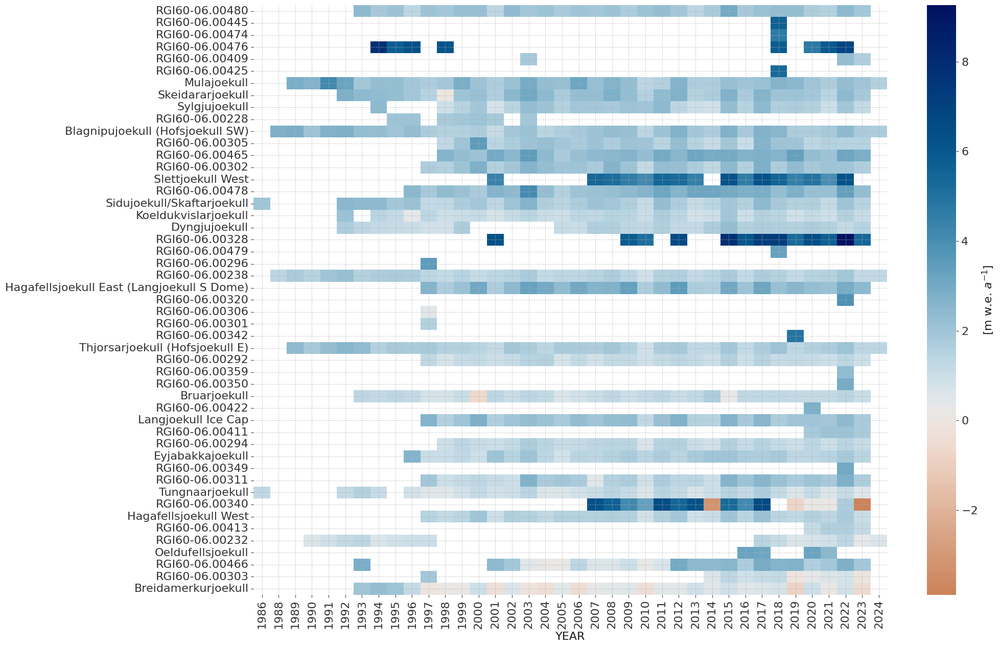

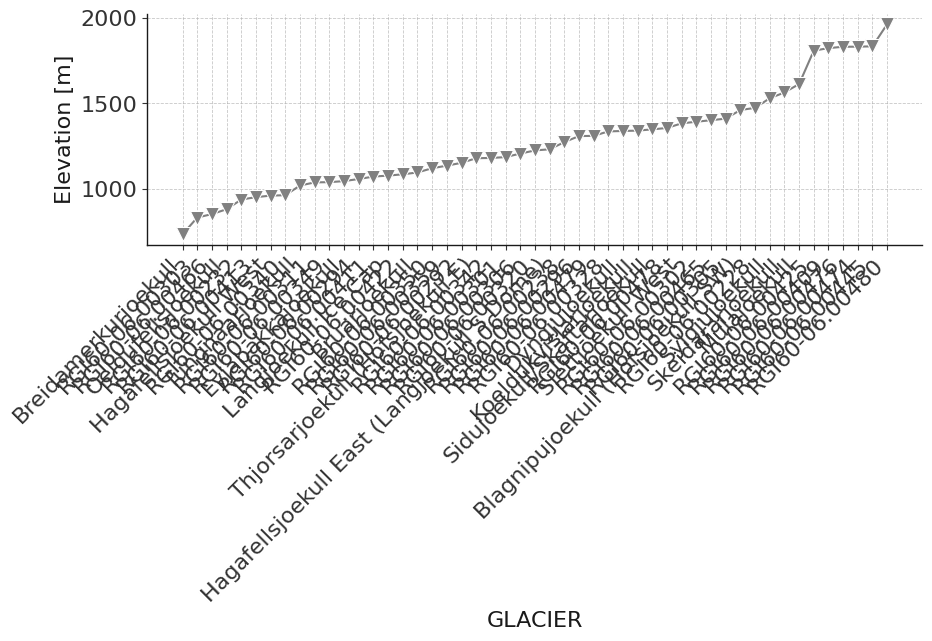

In [4]:
# Heatmap of mean mass balance per glacier:
# Get the mean mass balance per glacier

mean_mb_per_glacier = data_wgms.copy()
mean_mb_per_glacier['YEAR'] = mean_mb_per_glacier['TO_DATE'].astype(str).str[:4].astype(int)

mean_mb_per_glacier = mean_mb_per_glacier.groupby(
    ['GLACIER', 'YEAR', 'PERIOD'])['POINT_BALANCE'].mean().reset_index()
mean_mb_per_glacier = mean_mb_per_glacier[mean_mb_per_glacier['PERIOD'] == 'winter']

matrix = mean_mb_per_glacier.pivot(
    index='GLACIER', columns='YEAR',
    values='POINT_BALANCE').sort_values(by='GLACIER')

# get elevation of glaciers:
gl_per_el = data_wgms.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
gl_per_el = gl_per_el.sort_values(ascending=False)

# Order matrix:
matrix = matrix.loc[gl_per_el.index]
matrix.index = pd.Categorical(matrix.index,
                              categories=matrix.index,
                              ordered=True)

# Plot heatmap:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1)
heatmap = sns.heatmap(
    data=matrix,
    center=0,
    cmap=cm.vik_r,
    cbar_kws={'label': '[m w.e. $a^{-1}$]'},
    ax=ax,
)

# Plot elevation:
fig = plt.figure(figsize=(10, 3))  # Made figure slightly taller for labels
ax = plt.subplot(1, 1, 1)
sorted_elevations = gl_per_el.sort_values(ascending=True)

sns.lineplot(sorted_elevations,
             ax=ax,
             color='gray',
             marker='v')

# Add glacier names as x-tick labels
ax.set_xticks(range(len(sorted_elevations)))
ax.set_xticklabels(sorted_elevations.index, rotation=45, ha='right')
ax.set_ylabel('Elevation [m]')
plt.tight_layout()

In [5]:
data_wgms_test = data_wgms.copy()

# Initialize logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')

# Transform data to monthly format (run or load data):
paths = {
    'csv_path': path_PMB_WGMS_csv,
    'era5_climate_data': path_ERA5_raw + 'era5_monthly_averaged_data.nc',
    'geopotential_data': path_ERA5_raw + 'era5_geopotential_pressure.nc'
    #'radiation_save_path': path_pcsr + 'zarr/'
}

RUN = True
dataloader_gl = process_or_load_data(run_flag=RUN,
                                     df=data_wgms_test,
                                     paths=paths,
                                     cfg=cfg,
                                     vois_climate=vois_climate,
                                     vois_topographical=vois_topographical,
                                     output_file='ICE_dataset_monthly_full.csv')
data_monthly = dataloader_gl.data

display(data_monthly.head(2))

2025-05-26 14:49:02,338 - INFO - Number of annual and seasonal samples: 6586
2025-05-26 14:49:02,340 - INFO - Running on 49 glaciers:
['Thjorsarjoekull (Hofsjoekull E)' 'Sidujoekull/Skaftarjoekull'
 'Breidamerkurjoekull' 'Dyngjujoekull' 'RGI60-06.00328' 'Tungnaarjoekull'
 'Hagafellsjoekull West' 'Eyjabakkajoekull' 'RGI60-06.00303'
 'Langjoekull Ice Cap' 'Koeldukvislarjoekull' 'Oeldufellsjoekull'
 'Skeidararjoekull' 'Slettjoekull West' 'RGI60-06.00466' 'RGI60-06.00411'
 'RGI60-06.00302' 'RGI60-06.00359' 'RGI60-06.00340' 'Bruarjoekull'
 'Blagnipujoekull (Hofsjoekull SW)' 'RGI60-06.00238' 'RGI60-06.00320'
 'Sylgjujoekull' 'Hagafellsjoekull East (Langjoekull S Dome)'
 'RGI60-06.00342' 'RGI60-06.00480' 'RGI60-06.00465' 'RGI60-06.00294'
 'RGI60-06.00292' 'RGI60-06.00232' 'RGI60-06.00478' 'Mulajoekull'
 'RGI60-06.00301' 'RGI60-06.00413' 'RGI60-06.00311' 'RGI60-06.00350'
 'RGI60-06.00476' 'RGI60-06.00228' 'RGI60-06.00409' 'RGI60-06.00349'
 'RGI60-06.00422' 'RGI60-06.00305' 'RGI60-06.00425' 'RG

2025-05-26 14:49:02,424 - INFO - Number of winter and annual samples: 6586
2025-05-26 14:49:02,429 - INFO - Number of annual samples: 3205
2025-05-26 14:49:02,430 - INFO - Number of winter samples: 3381
2025-05-26 14:49:02,431 - INFO - Adding climate features...
2025-05-26 14:49:17,720 - INFO - Converting to monthly resolution...
2025-05-26 14:49:33,498 - INFO - Number of monthly rows: 62425
2025-05-26 14:49:33,500 - INFO - Columns in the dataset: Index(['YEAR', 'POINT_LON', 'POINT_LAT', 'POINT_BALANCE', 'ALTITUDE_CLIMATE',
       'ELEVATION_DIFFERENCE', 'POINT_ELEVATION', 'RGIId', 'POINT_ID', 'ID',
       'N_MONTHS', 'MONTHS', 'PERIOD', 'GLACIER', 'aspect', 'slope',
       'consensus_ice_thickness', 'millan_v', 't2m', 'tp', 'slhf', 'sshf',
       'ssrd', 'fal', 'str', 'u10', 'v10'],
      dtype='object')
2025-05-26 14:49:34,743 - INFO - Processed data saved to: /home/mburlet/scratch/data/DATA_MB/WGMS/Iceland/csv/ICE_dataset_monthly_full.csv


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,millan_v,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
0,1989.0,-18.595688,64.790063,0.45,1094.738918,-45.138918,1049.6,RGI60-06.00234,Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...,0,...,25.446609,-4.787933,0.003747,198886.0,590722.0,3990646.0,0.84564,-1779436.0,-0.590102,0.603381
1,1989.0,-18.595688,64.790063,0.45,1094.738918,-45.138918,1049.6,RGI60-06.00234,Thjorsarjoekull (Hofsjoekull E)_1989.0_annual_...,0,...,25.446609,-5.262054,0.003766,306376.0,576896.0,883468.0,0.84690,-1458576.0,0.129348,2.214950


In [18]:
display(data_monthly['ALTITUDE_CLIMATE'])

0        1094.738918
1        1094.738918
2        1094.738918
3        1094.738918
4        1094.738918
            ...     
62420    1394.770027
62421    1394.770027
62422    1394.770027
62423    1394.770027
62424    1394.770027
Name: ALTITUDE_CLIMATE, Length: 62425, dtype: float64

#### Feature Correlation

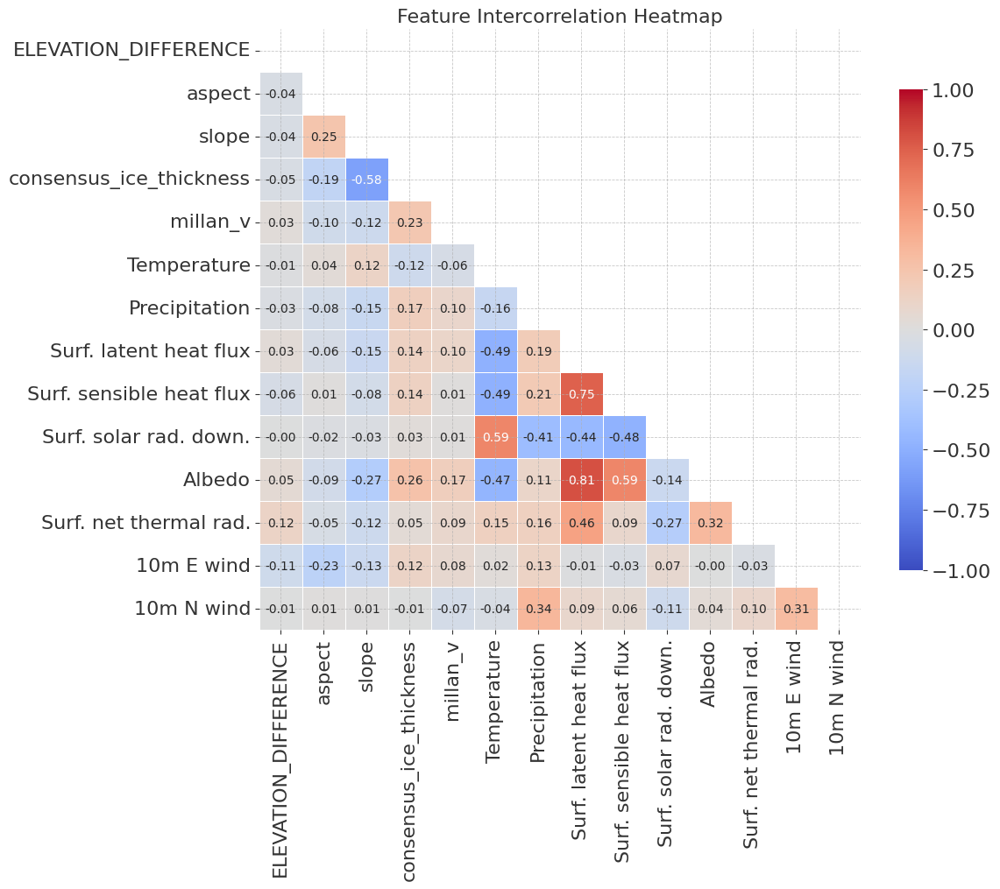

In [7]:
# Prepare data for correlation analysis
df = dataloader_gl.data.copy().dropna()

# Define the columns to keep
columns_to_keep = [
    col for col in df.columns if col not in [
        'GLACIER', 'PERIOD', 'YEAR', 'POINT_LON', 'POINT_LAT', 'POINT_BALANCE',
        'ALTITUDE_CLIMATE', 'POINT_ELEVATION', 'RGIId', 'POINT_ID', 'ID',
        'GLWD_ID', 'N_MONTHS', 'MONTHS'
    ]
]
df = df[columns_to_keep]

# Rename columns based on long names (if applicable)
df.rename(columns=vois_climate_long_name, inplace=True)

# Compute correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the heatmap
sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    vmax=1,
    vmin=-1,
    center=0,
    annot=True,  # Add correlation values
    fmt=".2f",
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": 0.8})

# Enhance readability
plt.title("Feature Intercorrelation Heatmap", fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

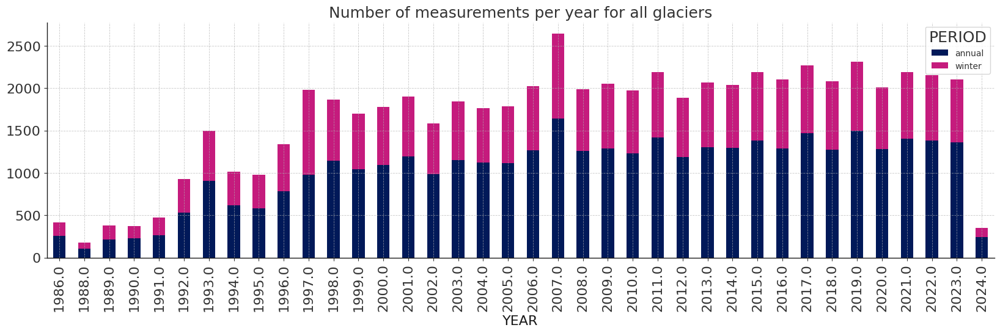

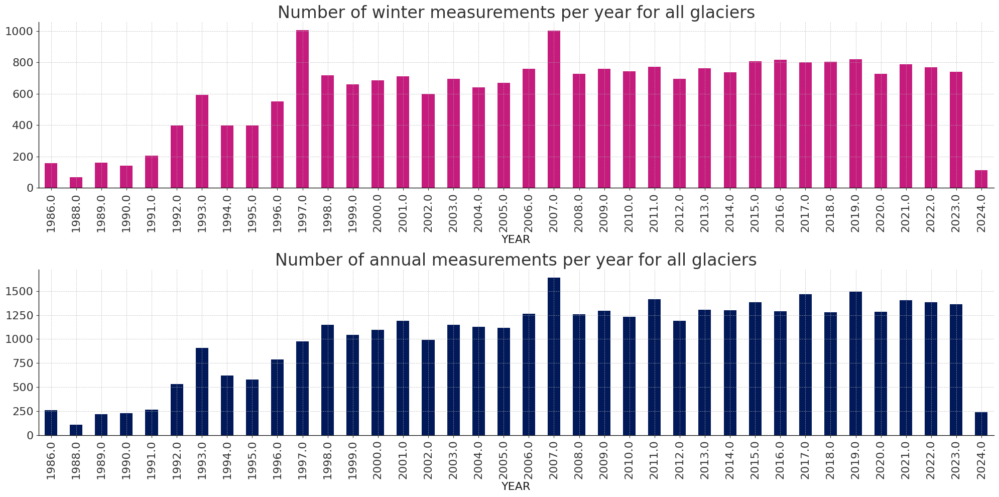

In [8]:
# Number of measurements per year:
dataloader_gl.data.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=[color_dark_blue, color_pink])
plt.title('Number of measurements per year for all glaciers')

# Plot winter and annual separately:
fig, axs = plt.subplots(2, 1, figsize=(20, 10), sharey=False)
dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter'].groupby(
    ['YEAR', 'PERIOD']).size().unstack().plot(kind='bar',
                                              ax=axs[0],
                                              color=[color_pink],
                                              legend=False)
axs[0].set_title('Number of winter measurements per year for all glaciers',
                 fontsize=24)

dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual'].groupby(
    ['YEAR', 'PERIOD']).size().unstack().plot(kind='bar',
                                              stacked=True,
                                              ax=axs[1],
                                              color=[color_dark_blue],
                                              legend=False)
axs[1].set_title('Number of annual measurements per year for all glaciers',
                 fontsize=24)
plt.tight_layout()

#### Sanity Check

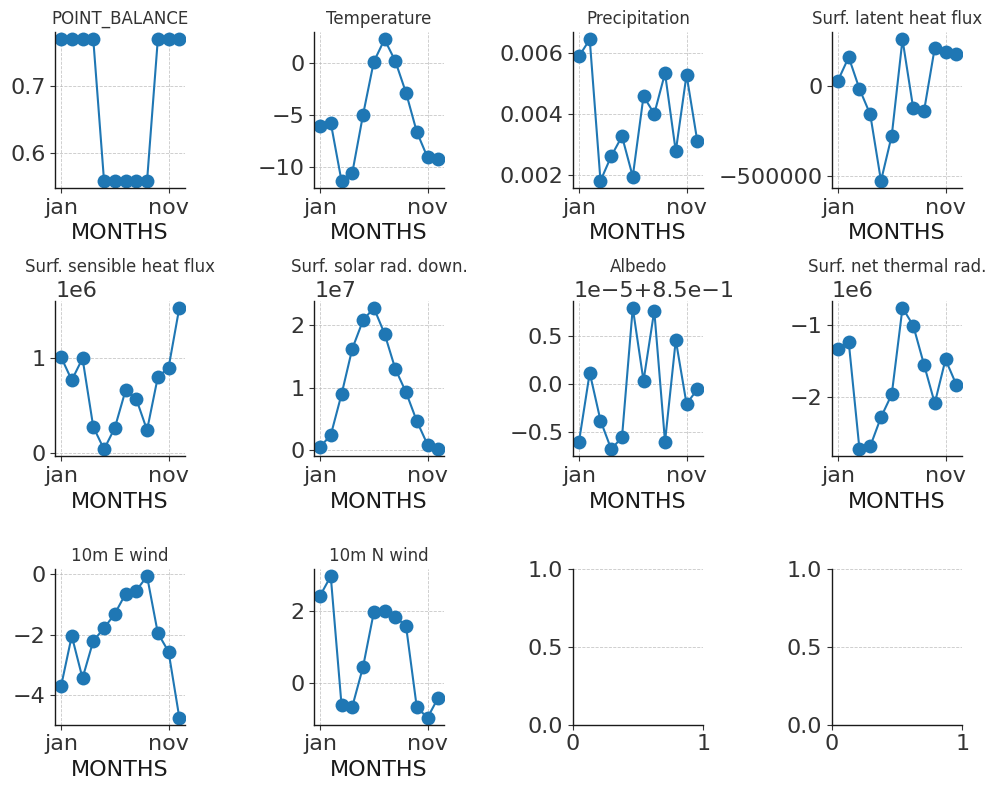

In [9]:
# Sanity check of variables:
df = dataloader_gl.data
var_to_plot = ['POINT_BALANCE'] + vois_climate
df = df[(df.GLACIER == 'Sylgjujoekull') & (df.YEAR == 2013)].groupby(
    ['MONTHS'])[var_to_plot].mean().reset_index()
df['month_nb'] = df.MONTHS.apply(
    lambda x: list(month_abbr).index(x.capitalize()))
df.sort_values(by='month_nb', inplace=True)
fig, ax = plt.subplots(3, 4, figsize=(10, 8))

for i, var in enumerate(var_to_plot):
    df.plot(x='MONTHS', y=var, marker='o', ax=ax.flatten()[i], legend=False)
    if var in vois_climate_long_name.keys():
        ax.flatten()[i].set_title(vois_climate_long_name[var], fontsize=12)
    else:
        ax.flatten()[i].set_title(var, fontsize=12)
plt.tight_layout()

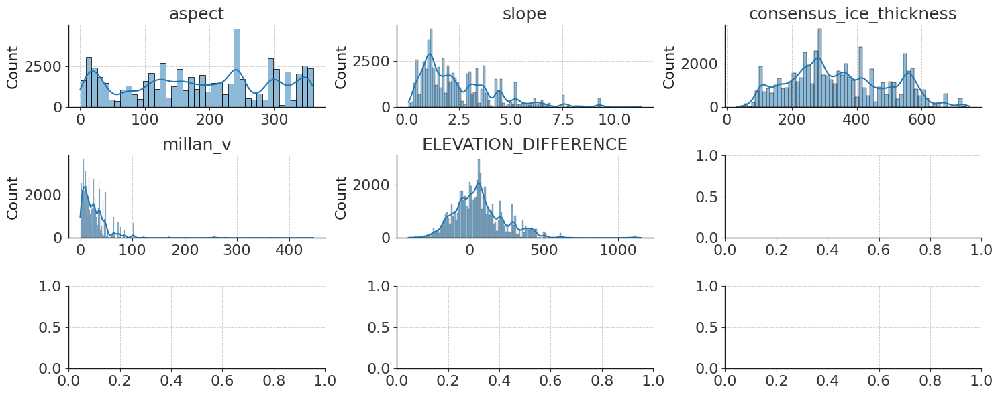

In [10]:
# Plot the distribution of the topo variables:
df = dataloader_gl.data
fig, axs = plt.subplots(3, 3, figsize=(15, 6))
for i, var in enumerate(vois_topographical + ['ELEVATION_DIFFERENCE']):
    ax = axs.flatten()[i]
    sns.histplot(df[var], ax=ax, kde=True)
    ax.set_xlabel('')
    ax.set_title(var)
plt.tight_layout()

In [39]:
display(df['GLACIER'].unique())

# Remove summer stakes
dataloader_gl.data = dataloader_gl.data[dataloader_gl.data['PERIOD'] != 'summer']
dataloader_gl.data = dataloader_gl.data.reset_index(drop=True)
data_monthly = dataloader_gl.data

display(dataloader_gl.data['PERIOD'].unique())

Langjokul = dataloader_gl.data[
    (dataloader_gl.data['POINT_LON'] < -19.4) & 
    (dataloader_gl.data['POINT_LAT'] > 64.3)
]['GLACIER'].unique()
display(Langjokul)


array(['Thjorsarjoekull (Hofsjoekull E)', 'Sidujoekull/Skaftarjoekull',
       'Breidamerkurjoekull', 'Dyngjujoekull', 'RGI60-06.00328',
       'Tungnaarjoekull', 'Hagafellsjoekull West', 'Eyjabakkajoekull',
       'RGI60-06.00303', 'Langjoekull Ice Cap', 'Koeldukvislarjoekull',
       'Oeldufellsjoekull', 'Skeidararjoekull', 'Slettjoekull West',
       'RGI60-06.00466', 'RGI60-06.00411', 'RGI60-06.00302',
       'RGI60-06.00359', 'RGI60-06.00340', 'Bruarjoekull',
       'Blagnipujoekull (Hofsjoekull SW)', 'RGI60-06.00238',
       'RGI60-06.00320', 'Sylgjujoekull',
       'Hagafellsjoekull East (Langjoekull S Dome)', 'RGI60-06.00342',
       'RGI60-06.00480', 'RGI60-06.00465', 'RGI60-06.00294',
       'RGI60-06.00292', 'RGI60-06.00232', 'RGI60-06.00478',
       'Mulajoekull', 'RGI60-06.00301', 'RGI60-06.00413',
       'RGI60-06.00311', 'RGI60-06.00350', 'RGI60-06.00476',
       'RGI60-06.00228', 'RGI60-06.00409', 'RGI60-06.00349',
       'RGI60-06.00422', 'RGI60-06.00305', 'RGI60-06.00

array(['annual', 'winter'], dtype=object)

array(['Hagafellsjoekull West', 'RGI60-06.00303', 'Langjoekull Ice Cap',
       'RGI60-06.00302', 'Hagafellsjoekull East (Langjoekull S Dome)',
       'RGI60-06.00294', 'RGI60-06.00292', 'RGI60-06.00301',
       'RGI60-06.00311', 'RGI60-06.00305', 'RGI60-06.00306',
       'RGI60-06.00296'], dtype=object)

#### Spatial Distribution

In [40]:
test_glaciers = ['Hagafellsjoekull West', 'RGI60-06.00303', 'Langjoekull Ice Cap',
       'RGI60-06.00302', 'Hagafellsjoekull East (Langjoekull S Dome)',
       'RGI60-06.00294', 'RGI60-06.00292', 'RGI60-06.00301',
       'RGI60-06.00311', 'RGI60-06.00305', 'RGI60-06.00306',
       'RGI60-06.00296']

# Ensure all test glaciers exist in the dataset
existing_glaciers = set(dataloader_gl.data.GLACIER.unique())
missing_glaciers = [g for g in test_glaciers if g not in existing_glaciers]

if missing_glaciers:
    print(
        f"Warning: The following test glaciers are not in the dataset: {missing_glaciers}"
    )

# Define training glaciers correctly
train_glaciers = [i for i in existing_glaciers if i not in test_glaciers]

data_test = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(test_glaciers)]
print('Size of test data:', len(data_test))

data_train = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(
    train_glaciers)]
print('Size of train data:', len(data_train))

if len(data_train) == 0:
    print("Warning: No training data available!")
else:
    test_perc = (len(data_test) / len(data_train)) * 100
    print('Percentage of test size: {:.2f}%'.format(test_perc))

# Number of annual versus winter measurements:
print('Train:')
print('Number of winter and annual samples:', len(data_train))
print('Number of annual samples:',
      len(data_train[data_train.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_train[data_train.PERIOD == 'winter']))

# Same for test
data_test_annual = data_test[data_test.PERIOD == 'annual']
data_test_winter = data_test[data_test.PERIOD == 'winter']

print('Test:')
print('Number of winter and annual samples:', len(data_test))
print('Number of annual samples:', len(data_test_annual))
print('Number of winter samples:', len(data_test_winter))

print('Total:')
print('Number of monthly rows:', len(dataloader_gl.data))
print('Number of annual rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual']))
print('Number of winter rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter']))

Size of test data: 11417
Size of train data: 51008
Percentage of test size: 22.38%
Train:
Number of winter and annual samples: 51008
Number of annual samples: 31520
Number of winter samples: 19488
Test:
Number of winter and annual samples: 11417
Number of annual samples: 7306
Number of winter samples: 4111
Total:
Number of monthly rows: 62425
Number of annual rows: 38826
Number of winter rows: 23599


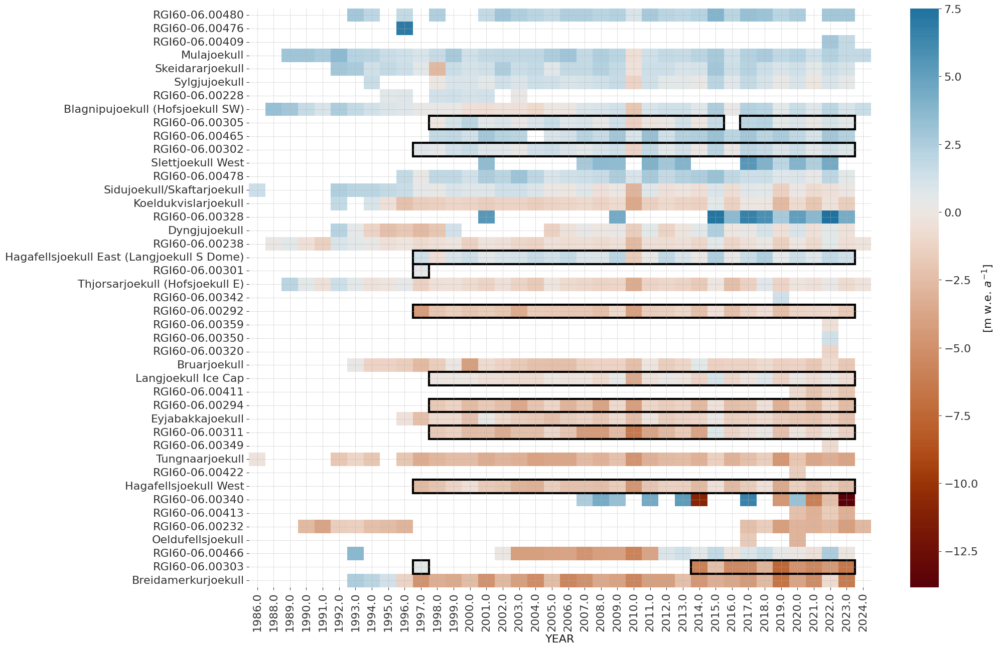

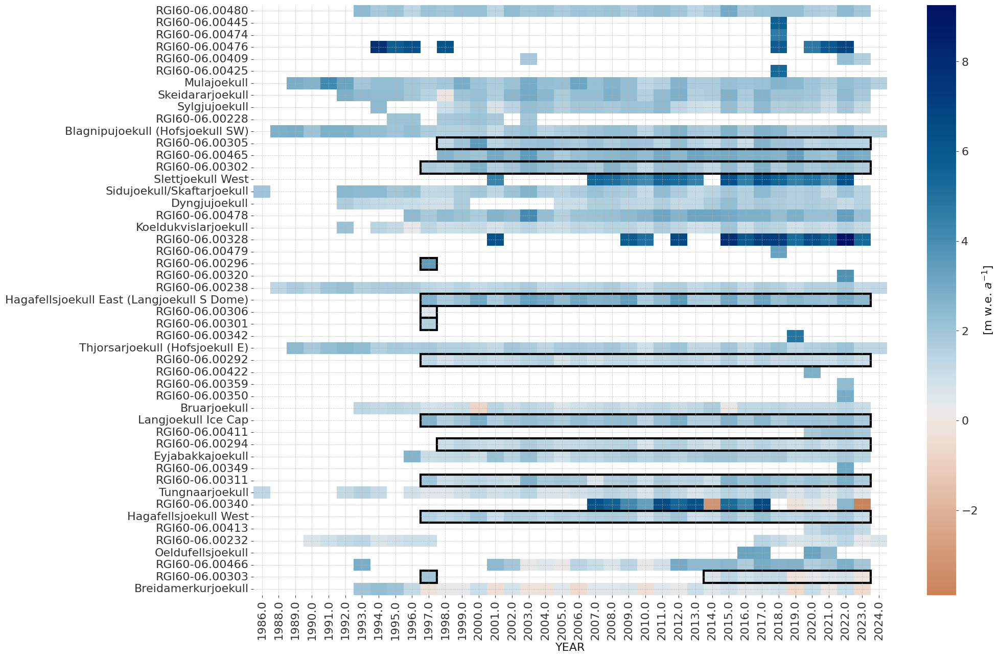

In [41]:
plotHeatmap(test_glaciers, data_monthly, period='annual')

plotHeatmap(test_glaciers, data_monthly, period='winter')

Test glaciers: (12) ['Hagafellsjoekull West' 'RGI60-06.00303' 'Langjoekull Ice Cap'
 'RGI60-06.00302' 'Hagafellsjoekull East (Langjoekull S Dome)'
 'RGI60-06.00294' 'RGI60-06.00292' 'RGI60-06.00301' 'RGI60-06.00311'
 'RGI60-06.00305' 'RGI60-06.00306' 'RGI60-06.00296']
Percentage of test size: 22.38%
Size of test set: 11417
Train glaciers: (37) ['Thjorsarjoekull (Hofsjoekull E)' 'Sidujoekull/Skaftarjoekull'
 'Breidamerkurjoekull' 'Dyngjujoekull' 'RGI60-06.00328' 'Tungnaarjoekull'
 'Eyjabakkajoekull' 'Koeldukvislarjoekull' 'Oeldufellsjoekull'
 'Skeidararjoekull' 'Slettjoekull West' 'RGI60-06.00466' 'RGI60-06.00411'
 'RGI60-06.00359' 'RGI60-06.00340' 'Bruarjoekull'
 'Blagnipujoekull (Hofsjoekull SW)' 'RGI60-06.00238' 'RGI60-06.00320'
 'Sylgjujoekull' 'RGI60-06.00342' 'RGI60-06.00480' 'RGI60-06.00465'
 'RGI60-06.00232' 'RGI60-06.00478' 'Mulajoekull' 'RGI60-06.00413'
 'RGI60-06.00350' 'RGI60-06.00476' 'RGI60-06.00228' 'RGI60-06.00409'
 'RGI60-06.00349' 'RGI60-06.00422' 'RGI60-06.00425' 'RGI

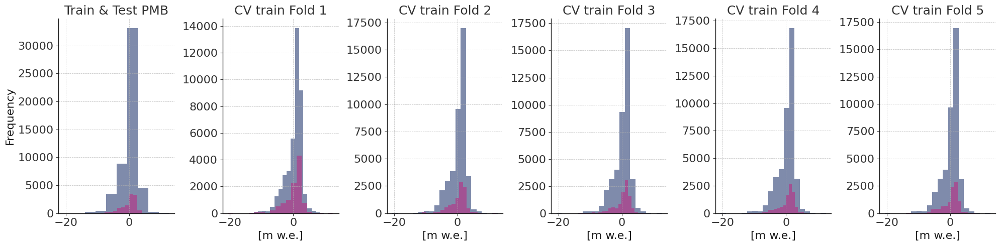

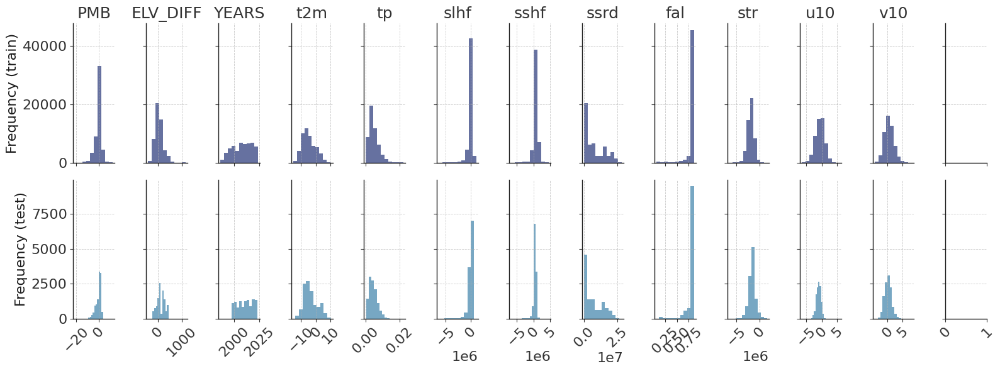

In [45]:
splits, test_set, train_set = get_CV_splits(dataloader_gl,
                                            test_split_on='GLACIER',
                                            test_splits=test_glaciers,
                                            random_state=cfg.seed)

print('Test glaciers: ({}) {}'.format(len(test_set['splits_vals']),
                                      test_set['splits_vals']))
test_perc = (len(test_set['df_X']) / len(train_set['df_X'])) * 100
print('Percentage of test size: {:.2f}%'.format(test_perc))
print('Size of test set:', len(test_set['df_X']))
print('Train glaciers: ({}) {}'.format(len(train_set['splits_vals']),
                                       train_set['splits_vals']))
print('Size of train set:', len(train_set['df_X']))

visualiseSplits(test_set['y'], train_set['y'], splits)
visualiseInputs(train_set, test_set, vois_climate)

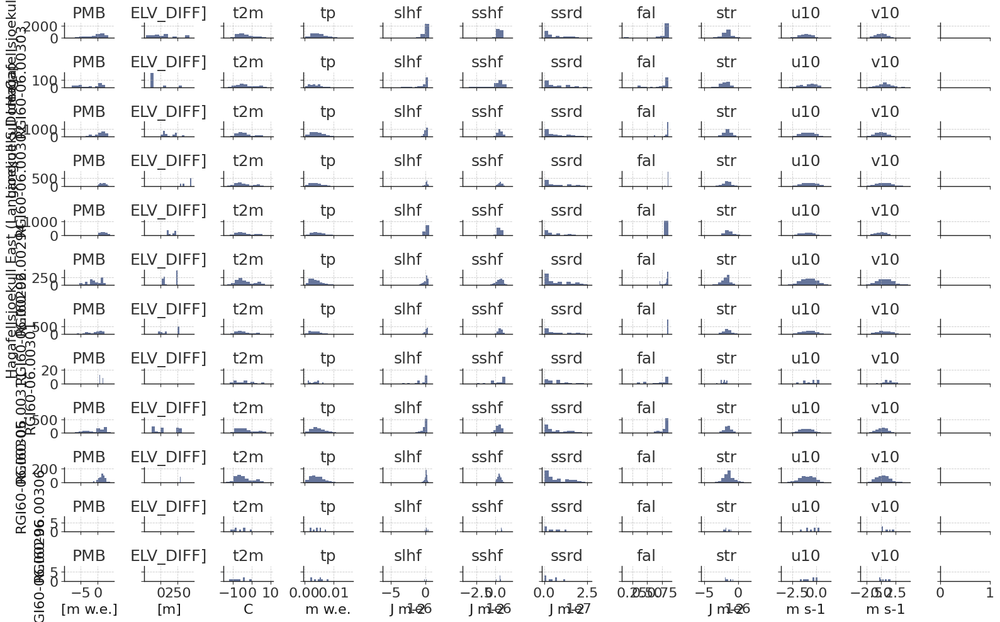

In [46]:
# plot distributions of test glaciers:
f, ax = plt.subplots(len(test_glaciers),
                     len(vois_climate) + 3,
                     figsize=(16, 10),
                     sharey='row',
                     sharex='col')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl['POINT_BALANCE'].plot.hist(ax=ax[i, 0],
                                          color=color_dark_blue,
                                          alpha=0.6,
                                          density=False)
    ax[i, 0].set_title('PMB')
    ax[i, 0].set_ylabel(test_gl)
    ax[i, 0].set_xlabel('[m w.e.]')
    test_df_gl['ELEVATION_DIFFERENCE'].plot.hist(ax=ax[i, 1],
                                                 color=color_dark_blue,
                                                 alpha=0.6,
                                                 density=False)
    ax[i, 1].set_title('ELV_DIFF]')
    ax[i, 1].set_xlabel('[m]')

    for j, voi_clim in enumerate(vois_climate):
        ax[i, 2 + j].set_title(voi_clim)
        test_df_gl[voi_clim].plot.hist(ax=ax[i, 2 + j],
                                       color=color_dark_blue,
                                       alpha=0.6,
                                       density=False)
        ax[i, 2 + j].set_xlabel(vois_units[voi_clim])

plt.tight_layout()

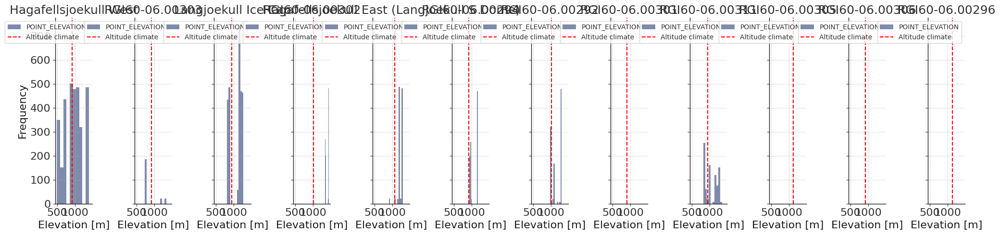

In [47]:
f, ax = plt.subplots(1,
                     len(test_glaciers),
                     figsize=(20, 5),
                     sharey='row',
                     sharex='row')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl.POINT_ELEVATION.plot.hist(color=color_dark_blue,
                                         alpha=0.5,
                                         density=False,
                                         ax=ax[i])
    # add vertical line for altitude climate
    alt_climate = test_df_gl.ALTITUDE_CLIMATE.mean()
    ax[i].axvline(x=alt_climate,
                  color='red',
                  linestyle='--',
                  label='Altitude climate')
    ax[i].set_xlabel('Elevation [m]')
    ax[i].legend()
    ax[i].set_title(test_gl)
plt.tight_layout()

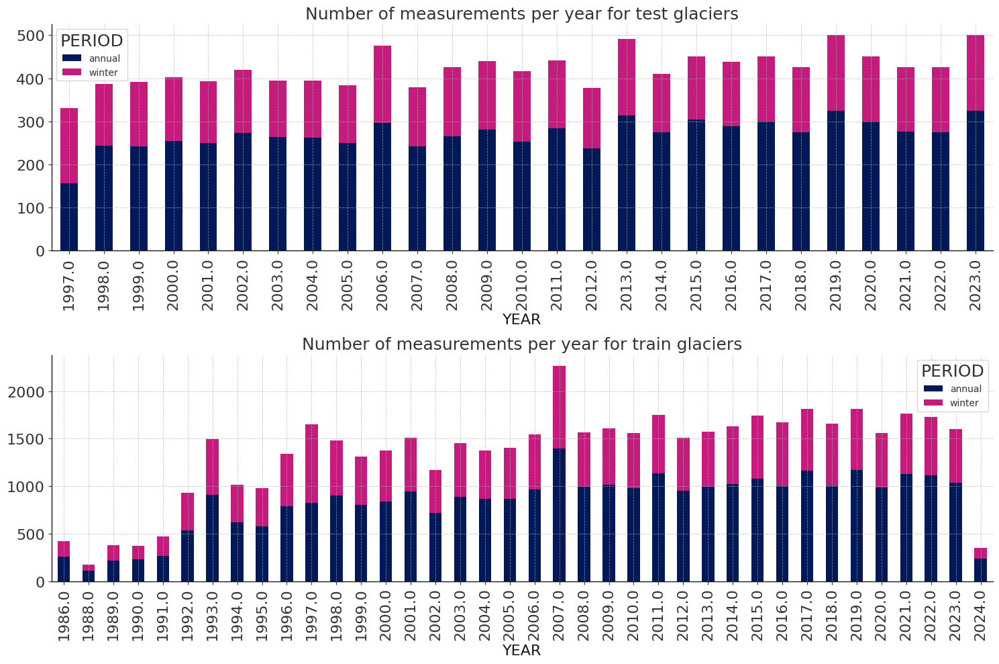

In [48]:
# Number of measurements per year:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
data_test.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[0])
ax[0].set_title('Number of measurements per year for test glaciers')

# Number of measurements per year:
data_train.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[1])
ax[1].set_title('Number of measurements per year for train glaciers')
plt.tight_layout()

## XGBoost:

In [49]:
# Grid search
# For each of the XGBoost parameter, define the grid range
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8],
    'n_estimators':
    [50, 100, 200, 300, 400, 500, 600,
     700],  # number of trees (too many = overfitting, too few = underfitting)
    'learning_rate': [0.01, 0.1, 0.15, 0.2, 0.25, 0.3]
}

param_init = {}
param_init['device'] = 'cuda:0'
param_init['tree_method'] = 'hist'
param_init["random_state"] = cfg.seed
param_init["n_jobs"] = cfg.numJobs

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect",
    "slope",
    #"hugonnet_dhdt",
    "consensus_ice_thickness",
    "millan_v",
]

### Grid search:

In [ ]:
%%time
# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

RUN = True
if RUN:
    # Create a CustomXGBoostRegressor instance
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg, **param_init)
    custom_xgboost.randomsearch(
        parameters=param_grid,
        n_iter=45,
        splits=splits,
        features=df_X_train_subset,
        targets=train_set['y'],
    )

    # save best model
    custom_xgboost.save_model(f'xgb_Iceland.pkl')
else:
    # read model
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg)
    custom_xgboost.load_model(
        f'xgb_Iceland.pkl')  # model with SGI aspect&slope

# Get best parameters and estimator
best_params = custom_xgboost.param_search.best_params_
best_estimator = custom_xgboost.param_search.best_estimator_
print("Best parameters:\n", best_params)
print("Best score:\n", custom_xgboost.param_search.best_score_)

# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

# Make predictions on test
features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)

# Calculate scores
score = best_estimator_cpu.score(test_set['df_X'][all_columns],
                                 test_set['y'])  # negative
print('Overall score:', np.abs(score))

Shape of training dataset: (50026, 25)
Shape of testing dataset: (10239, 25)
Running with features: ['ELEVATION_DIFFERENCE', 't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10', 'aspect', 'slope', 'hugonnet_dhdt', 'consensus_ice_thickness']
Fitting 5 folds for each of 45 candidates, totalling 225 fits


/home/mburlet/anaconda3/envs/MassBalanceMachine/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:59:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "cfg" } are not used.

  warnings.warn(smsg, UserWarning)
/home/mburlet/anaconda3/envs/MassBalanceMachine/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:59:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "cfg" } are not used.

  warnings.warn(smsg, UserWarning)
/home/mburlet/anaconda3/envs/MassBalanceMachine/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:59:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "cfg" } are not used.

  warnings.warn(smsg, UserWarning)
/home/mburlet/anaconda3/envs/MassBalanceMachine/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [17:59:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "cfg" } are not used.

  warnings.warn(smsg, UserWarning)
/home/mburlet/anaconda3/envs/MassBalanceMachine/lib/python3.

Best parameters:
 {'n_estimators': 700, 'max_depth': 7, 'learning_rate': 0.1}
Best score:
 -0.256253808455725
Shape of the test: (10239, 14)
Overall score: 0.996050433028221
CPU times: user 6min 12s, sys: 2.35 s, total: 6min 14s
Wall time: 6min 29s


In [ ]:
# visualiseValPreds(best_estimator, splits, train_set, feature_columns)

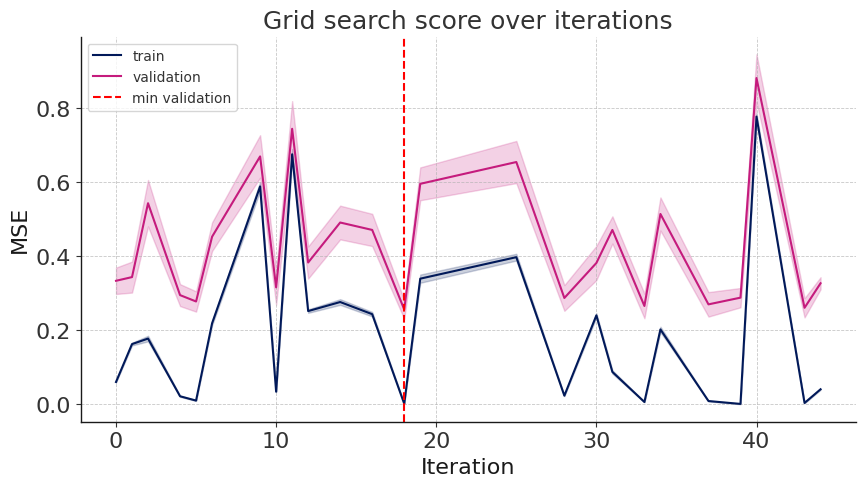

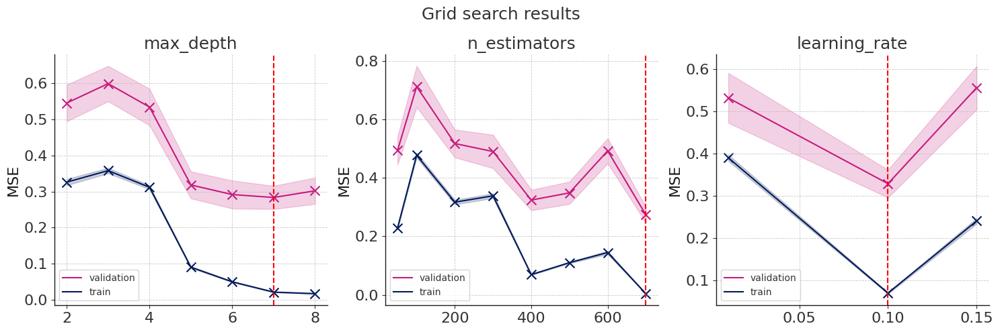

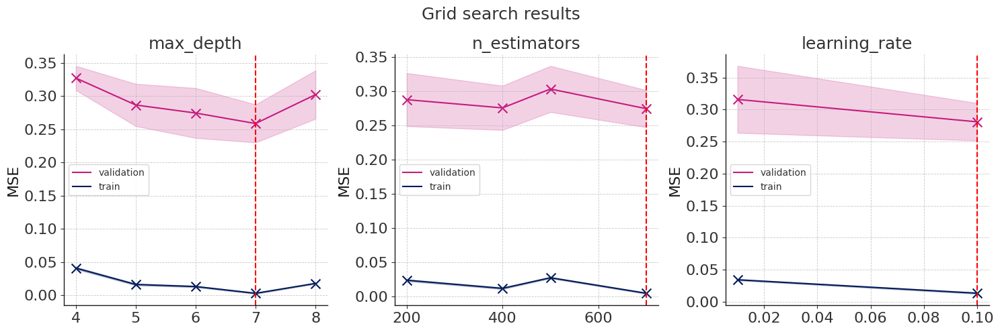

In [20]:
plotGridSearchScore(cv_results_=custom_xgboost.param_search.cv_results_,
                    lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss,
                     N=10)

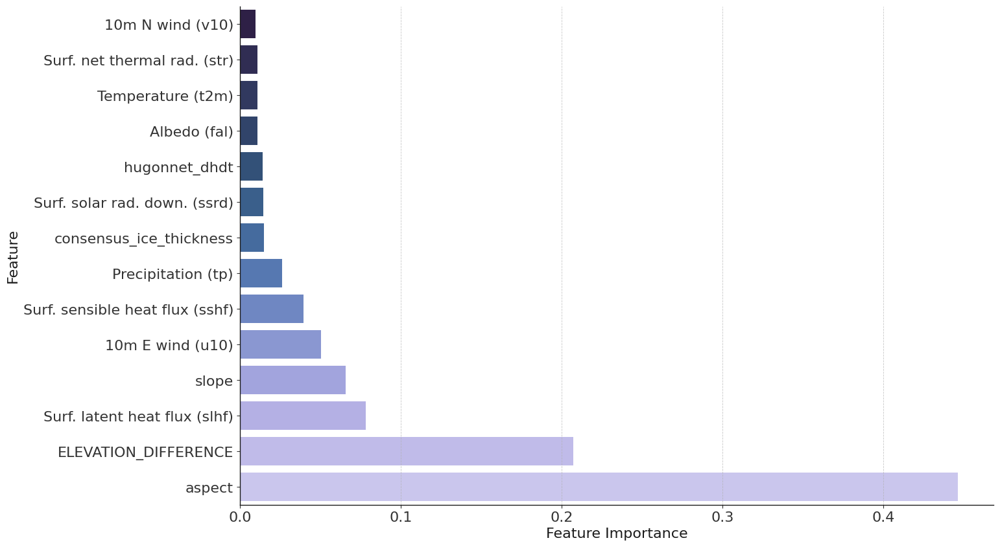

In [21]:
FIPlot(best_estimator, feature_columns, vois_climate)

#### Predictions of best parameters:

Shape of the test: (10239, 14)
{'Vestre Memurubreen': '#a6cee3', 'Rembesdalskaaka': '#1f78b4', 'Blabreen': '#b2df8a', 'Graafjellsbrea': '#33a02c', 'Breidablikkbrea': '#fb9a99', 'Ruklebreen': '#e31a1c', 'Bondhusbrea': '#fdbf6f', 'Svelgjabreen': '#ff7f00', 'Moesevassbrea': '#cab2d6', 'Blomstoelskardsbreen': '#6a3d9a'}


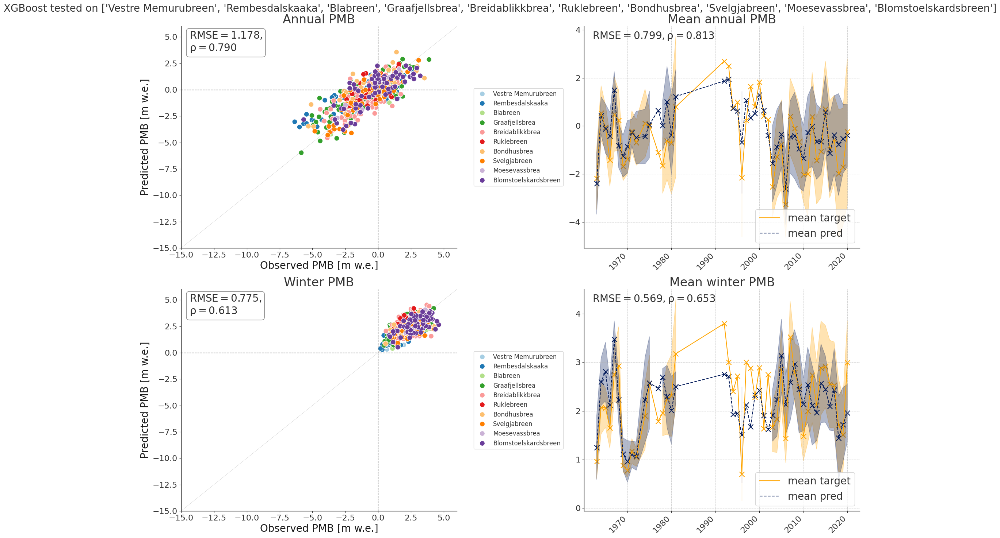

In [22]:
# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)
grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu)
plt.suptitle(f'XGBoost tested on {test_glaciers}', fontsize=20)
plt.tight_layout()

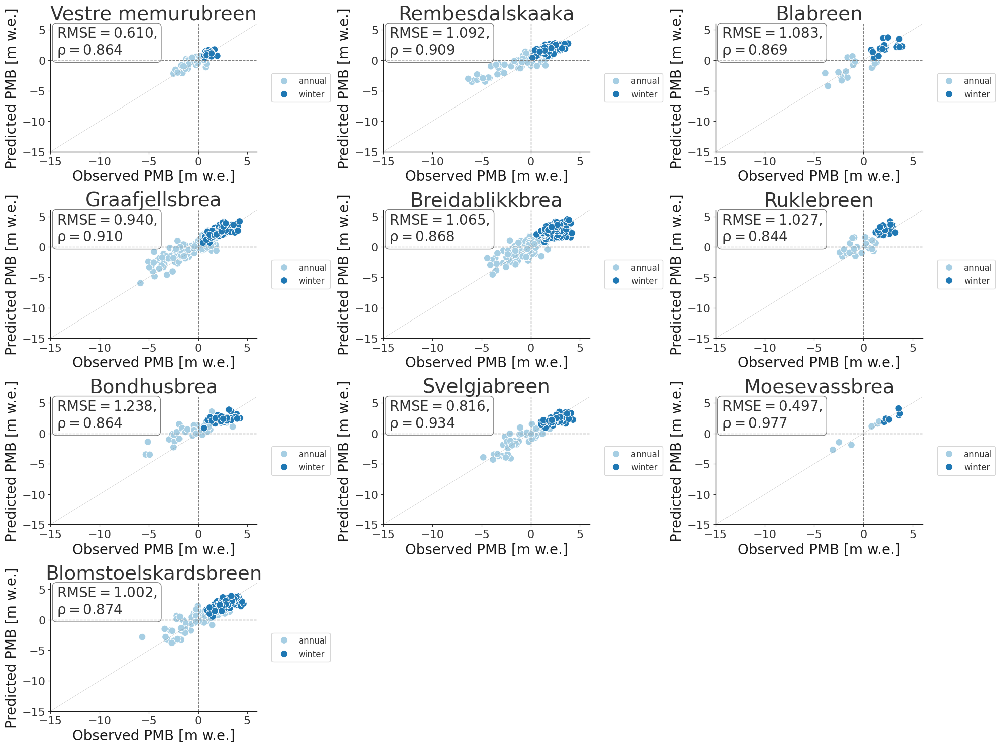

In [23]:
PlotIndividualGlacierPredVsTruth(grouped_ids, figsize=(20, 15))

In [ ]:
display(data_monthly['GLACIER'].unique())

array(['GOLDBERG K.', 'HALLSTAETTER G.', 'HINTEREIS F.', 'JAMTAL F.',
       'KESSELWAND F.', 'KLEINFLEISS K.', 'OE. WURTEN K.', 'VENEDIGER K.',
       'VERNAGT F.', 'ZETTALUNITZ/MULLWITZ K.', 'CAMPO SETT.', 'CARESER',
       'CARESER CENTRALE', 'CARESER OCCIDENTALE', 'CARESER ORIENTALE',
       'CIARDONEY', 'FONTANA BIANCA / WEISSBRUNNF.', 'GRAND ETRET',
       'LUNGA (VEDRETTA) / LANGENF.', 'LUPO',
       'MALAVALLE (VEDR. DI) / UEBELTALF.',
       'PENDENTE (VEDR.) / HANGENDERF.',
       'RIES OCC. (VEDR. DI) / RIESERF. WESTL.', 'SURETTA MERIDIONALE'],
      dtype=object)

#### Train CH Test NOR

###### Load CH galciers and merge with IT_AT

In [11]:
data_CH = pd.read_csv('/home/mburlet/scratch/data/GLAMOS/point/csv/CH_wgms_dataset_all.csv')
data_NOR = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/Norway/csv/Nor_dataset_all_oggm.csv')
display(data_NOR)

display(data_CH.columns)

display(data_NOR.columns)

data_CH = data_CH.drop(['millan_v', 'aspect_sgi', 'slope_sgi', 'topo_sgi'], axis=1)

display(data_CH.columns)

# Merge CH with NOR
data_NOR_CH = pd.concat([data_NOR, data_CH], axis=0).reset_index(drop=True)

display(data_NOR_CH.head(2))

display(len(data_NOR_CH['GLACIER'].unique()))

,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,RGIId,YEAR,GLACIER,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,POINT_ID
0,70.12589,21.77702,471,20120925,20131107,-4.92,annual,RGI60-08.01258,2013,Langfjordjoekulen,36.073272,15.972541,425.458893,-3.314563,96.980293,Langfjordjoekulen_2013_annual_0
1,70.12578,21.77630,439,20131107,20140924,-2.67,annual,RGI60-08.01258,2014,Langfjordjoekulen,33.570984,16.993369,434.652008,-2.934460,89.294670,Langfjordjoekulen_2014_annual_1
2,70.12573,21.77590,444,20140924,20150923,-3.41,annual,RGI60-08.01258,2015,Langfjordjoekulen,38.002076,17.332428,441.768280,-2.923457,90.894768,Langfjordjoekulen_2015_annual_2
3,70.12573,21.77590,444,20150923,20160922,-3.59,annual,RGI60-08.01258,2016,Langfjordjoekulen,38.002076,17.332428,441.768280,-2.923457,90.894768,Langfjordjoekulen_2016_annual_3
4,70.12554,21.77352,468,20160922,20170929,-2.46,annual,RGI60-08.01258,2017,Langfjordjoekulen,47.942662,17.715600,458.299377,-2.962617,97.562950,Langfjordjoekulen_2017_annual_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6292,59.93803,6.34733,1078,20111001,20120503,1.50,winter,RGI60-08.02969,2012,Blomstoelskardsbreen,166.504029,7.546811,1093.000000,-1.385310,68.130363,Blomstoelskardsbreen_2012_winter_7656
6293,59.93789,6.34729,1078,20121012,20130529,1.14,winter,RGI60-08.02969,2013,Blomstoelskardsbreen,166.504029,7.546811,1093.000000,-1.385310,68.130363,Blomstoelskardsbreen_2013_winter_7657
6294,59.93815,6.34702,1079,20141014,20150422,1.19,winter,RGI60-08.02969,2015,Blomstoelskardsbreen,166.504029,7.546811,1093.000000,-1.385310,68.130363,Blomstoelskardsbreen_2015_winter_7658
6295,59.93803,6.34724,1078,20151014,20160428,1.72,winter,RGI60-08.02969,2016,Blomstoelskardsbreen,166.504029,7.546811,1093.000000,-1.385310,68.130363,Blomstoelskardsbreen_2016_winter_7659


Index(['YEAR', 'POINT_ID', 'GLACIER', 'FROM_DATE', 'TO_DATE', 'POINT_LAT',
       'POINT_LON', 'POINT_ELEVATION', 'POINT_BALANCE', 'PERIOD', 'RGIId',
       'aspect', 'slope', 'topo', 'hugonnet_dhdt', 'consensus_ice_thickness',
       'millan_v', 'aspect_sgi', 'slope_sgi', 'topo_sgi'],
      dtype='object')

Index(['POINT_LAT', 'POINT_LON', 'POINT_ELEVATION', 'FROM_DATE', 'TO_DATE',
       'POINT_BALANCE', 'PERIOD', 'RGIId', 'YEAR', 'GLACIER', 'aspect',
       'slope', 'topo', 'hugonnet_dhdt', 'consensus_ice_thickness',
       'POINT_ID'],
      dtype='object')

Index(['YEAR', 'POINT_ID', 'GLACIER', 'FROM_DATE', 'TO_DATE', 'POINT_LAT',
       'POINT_LON', 'POINT_ELEVATION', 'POINT_BALANCE', 'PERIOD', 'RGIId',
       'aspect', 'slope', 'topo', 'hugonnet_dhdt', 'consensus_ice_thickness'],
      dtype='object')

,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,RGIId,YEAR,GLACIER,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,POINT_ID
0,70.12589,21.77702,471.0,20120925,20131107,-4.92,annual,RGI60-08.01258,2013,Langfjordjoekulen,36.073272,15.972541,425.458893,-3.314563,96.980293,Langfjordjoekulen_2013_annual_0
1,70.12578,21.77630,439.0,20131107,20140924,-2.67,annual,RGI60-08.01258,2014,Langfjordjoekulen,33.570984,16.993369,434.652008,-2.934460,89.294670,Langfjordjoekulen_2014_annual_1


71

In [12]:
display(data_NOR_CH.head(2))

,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,RGIId,YEAR,GLACIER,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,POINT_ID
0,70.12589,21.77702,471.0,20120925,20131107,-4.92,annual,RGI60-08.01258,2013,Langfjordjoekulen,36.073272,15.972541,425.458893,-3.314563,96.980293,Langfjordjoekulen_2013_annual_0
1,70.12578,21.77630,439.0,20131107,20140924,-2.67,annual,RGI60-08.01258,2014,Langfjordjoekulen,33.570984,16.993369,434.652008,-2.934460,89.294670,Langfjordjoekulen_2014_annual_1


In [13]:
display(data_NOR_CH['PERIOD'].unique())

array(['annual', 'winter'], dtype=object)

In [14]:
data_CH_NOR_test = data_NOR_CH.copy()

display(data_CH_NOR_test.shape)
display(data_CH_NOR_test.head(2))

# Initialize logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')

# Transform data to monthly format (run or load data):
paths = {
    'csv_path': path_PMB_WGMS_csv,
    'era5_climate_data': '/home/mburlet/scratch/data/DATA_MB/WGMS/Norway/ERA5Land/raw/test/era5_monthly_averaged_data_CHNOR.nc',
    'geopotential_data': '/home/mburlet/scratch/data/DATA_MB/WGMS/Norway/ERA5Land/raw/test/era5_geopotential_pressure_CHNOR.nc'
    #'radiation_save_path': path_pcsr + 'zarr/'
}

RUN = False
dataloader_gl = process_or_load_data(run_flag=RUN,
                                     df=data_CH_NOR_test,
                                     paths=paths,
                                     cfg=cfg,
                                     vois_climate=vois_climate,
                                     vois_topographical=vois_topographical,
                                     output_file= 'CH_NOR_wgms_dataset_monthly_full.csv')
data_monthly_CH_NOR = dataloader_gl.data

display(data_monthly_CH_NOR.head(2))

(39655, 16)

,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,RGIId,YEAR,GLACIER,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,POINT_ID
0,70.12589,21.77702,471.0,20120925,20131107,-4.92,annual,RGI60-08.01258,2013,Langfjordjoekulen,36.073272,15.972541,425.458893,-3.314563,96.980293,Langfjordjoekulen_2013_annual_0
1,70.12578,21.77630,439.0,20131107,20140924,-2.67,annual,RGI60-08.01258,2014,Langfjordjoekulen,33.570984,16.993369,434.652008,-2.934460,89.294670,Langfjordjoekulen_2014_annual_1


2025-05-15 12:04:50,201 - INFO - Loaded preprocessed data.
2025-05-15 12:04:50,202 - INFO - Number of monthly rows: 361383
2025-05-15 12:04:50,232 - INFO - Number of annual rows: 132331
2025-05-15 12:04:50,266 - INFO - Number of winter rows: 229052


,YEAR,POINT_LON,POINT_LAT,POINT_BALANCE,ALTITUDE_CLIMATE,ELEVATION_DIFFERENCE,POINT_ELEVATION,RGIId,POINT_ID,ID,...,consensus_ice_thickness,t2m,tp,slhf,sshf,ssrd,fal,str,u10,v10
0,2013,21.77702,70.12589,-4.92,341.344485,129.655515,471.0,RGI60-08.01258,Langfjordjoekulen_2013_annual_0,0,...,96.980293,-0.428070,0.003846,-55354.0,657502.0,2040907.0,0.439741,-2504336.0,-0.141248,0.397857
1,2013,21.77702,70.12589,-4.92,341.344485,129.655515,471.0,RGI60-08.01258,Langfjordjoekulen_2013_annual_0,0,...,96.980293,-4.780853,0.003902,178386.0,909366.0,157664.0,0.817481,-1714196.0,-0.183276,1.758524


###### use this norway_kamilla_glacierlist to test on the same glaciers as in the norway paper

In [15]:
## find RGIId of Glaciers Kamilla used as test set

glacier_list_df = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/Norway/data/glaciological_point_mass_balance_Norway.csv')


# breid ids that Kamilla used as test set
breid_list = [54, 703, 941, 1135, 1280, 2085, 2320, 2478, 2768, 2769, 3133, 3137, 3138, 3141]


breid_to_rgiid = {}
for breid in breid_list:
    matching_row = glacier_list_df[glacier_list_df['breid'] == breid]
    rgiid = matching_row['rgiid'].iloc[0]
    breid_to_rgiid[breid] = rgiid


# Display the mapping
print("Mapping from breid to RGI ID:")
for breid, rgiid in breid_to_rgiid.items():
    print(f"{breid}: {rgiid}")

# Create a list of just the RGI IDs for easy use
test_rgiids = list(breid_to_rgiid.values())
print("\nList of test RGI IDs:")
print(test_rgiids)

rgi_to_glacier = {}

for rgi_id in test_rgiids:
    matching_rows = data_NOR[data_NOR['RGIId'] == rgi_id]
    glacier_name = matching_rows['GLACIER'].iloc[0]
    rgi_to_glacier[rgi_id] = glacier_name


print("RGI ID to Glacier Name mapping:")
for rgi_id, glacier_name in rgi_to_glacier.items():
    print(f"{rgi_id}: {glacier_name}")

norway_kamilla_glacierlist = list(rgi_to_glacier.values())
print("\nList of test RGI IDs:")
print(norway_kamilla_glacierlist)



Mapping from breid to RGI ID:
54: RGI60-08.01258
703: RGI60-08.01026
941: RGI60-08.02384
1135: RGI60-08.01598
1280: RGI60-08.01484
2085: RGI60-08.02650
2320: RGI60-08.00434
2478: RGI60-08.01286
2768: RGI60-08.00449
2769: RGI60-08.01013
3133: RGI60-08.02916
3137: RGI60-08.02918
3138: RGI60-08.02920
3141: RGI60-08.02969

List of test RGI IDs:
['RGI60-08.01258', 'RGI60-08.01026', 'RGI60-08.02384', 'RGI60-08.01598', 'RGI60-08.01484', 'RGI60-08.02650', 'RGI60-08.00434', 'RGI60-08.01286', 'RGI60-08.00449', 'RGI60-08.01013', 'RGI60-08.02916', 'RGI60-08.02918', 'RGI60-08.02920', 'RGI60-08.02969']
RGI ID to Glacier Name mapping:
RGI60-08.01258: Langfjordjoekulen
RGI60-08.01026: Cainhavarre
RGI60-08.02384: Rundvassbreen
RGI60-08.01598: Svartisheibreen
RGI60-08.01484: Trollbergdalsbreen
RGI60-08.02650: Hansebreen
RGI60-08.00434: Tunsbergdalsbreen
RGI60-08.01286: Austdalsbreen
RGI60-08.00449: Hellstugubreen
RGI60-08.01013: Austre Memurubreen
RGI60-08.02916: Bondhusbrea
RGI60-08.02918: Svelgjabreen

In [28]:
#test_glaciers = norway_kamilla_glacierlist 
test_glaciers = list(data_NOR['GLACIER'].unique())

# Ensure all test glaciers exist in the dataset
existing_glaciers = set(dataloader_gl.data.GLACIER.unique())
missing_glaciers = [g for g in test_glaciers if g not in existing_glaciers]

if missing_glaciers:
    print(
        f"Warning: The following test glaciers are not in the dataset: {missing_glaciers}"
    )

# Define training glaciers correctly
#train_glaciers = list(data_CH['GLACIER'].unique())
train_glaciers = [i for i in existing_glaciers if i not in test_glaciers]

data_test = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(test_glaciers)]
print('Size of test data:', len(data_test))

data_train = dataloader_gl.data[dataloader_gl.data.GLACIER.isin(
    train_glaciers)]
print('Size of train data:', len(data_train))

if len(data_train) == 0:
    print("Warning: No training data available!")
else:
    test_perc = (len(data_test) / len(data_train)) * 100
    print('Percentage of test size: {:.2f}%'.format(test_perc))

# Number of annual versus winter measurements:
print('Train:')
print('Number of winter and annual samples:', len(data_train))
print('Number of annual samples:',
      len(data_train[data_train.PERIOD == 'annual']))
print('Number of winter samples:',
      len(data_train[data_train.PERIOD == 'winter']))

# Same for test
data_test_annual = data_test[data_test.PERIOD == 'annual']
data_test_winter = data_test[data_test.PERIOD == 'winter']

print('Test:')
print('Number of winter and annual samples:', len(data_test))
print('Number of annual samples:', len(data_test_annual))
print('Number of winter samples:', len(data_test_winter))

print('Total:')
print('Number of monthly rows:', len(dataloader_gl.data))
print('Number of annual rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'annual']))
print('Number of winter rows:',
      len(dataloader_gl.data[dataloader_gl.data.PERIOD == 'winter']))

Size of test data: 60265
Size of train data: 301118
Percentage of test size: 20.01%
Train:
Number of winter and annual samples: 301118
Number of annual samples: 93904
Number of winter samples: 207214
Test:
Number of winter and annual samples: 60265
Number of annual samples: 38427
Number of winter samples: 21838
Total:
Number of monthly rows: 361383
Number of annual rows: 132331
Number of winter rows: 229052


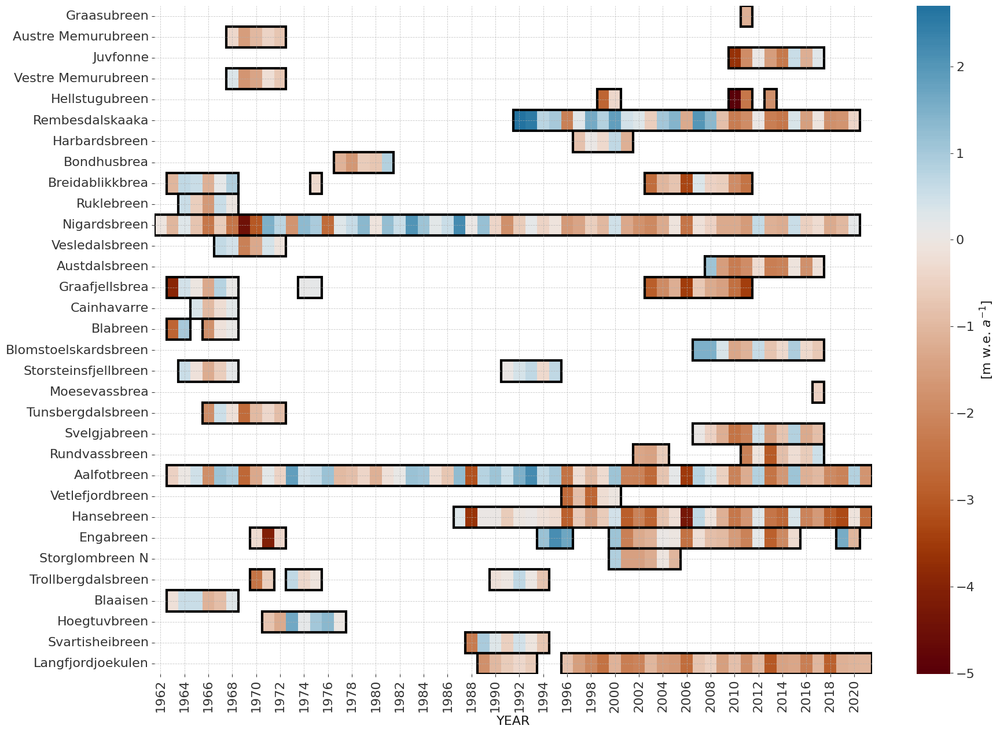

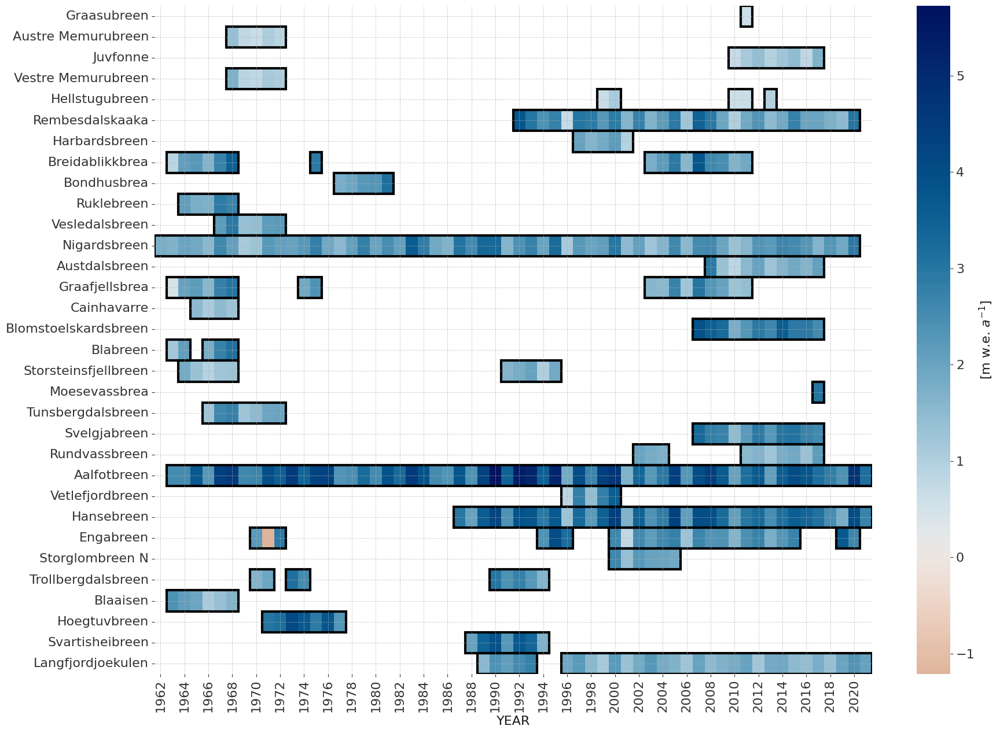

In [29]:
plotHeatmap(test_glaciers, data_monthly, period='annual')

plotHeatmap(test_glaciers, data_monthly, period='winter')

Test glaciers: (32) ['Langfjordjoekulen' 'Blaaisen' 'Storsteinsfjellbreen' 'Cainhavarre'
 'Rundvassbreen' 'Storglombreen N' 'Engabreen' 'Svartisheibreen'
 'Hoegtuvbreen' 'Trollbergdalsbreen' 'Aalfotbreen' 'Hansebreen'
 'Vetlefjordbreen' 'Nigardsbreen' 'Tunsbergdalsbreen' 'Vesledalsbreen'
 'Austdalsbreen' 'Harbardsbreen' 'Juvfonne' 'Graasubreen' 'Hellstugubreen'
 'Austre Memurubreen' 'Vestre Memurubreen' 'Rembesdalskaaka' 'Blabreen'
 'Graafjellsbrea' 'Breidablikkbrea' 'Ruklebreen' 'Bondhusbrea'
 'Svelgjabreen' 'Moesevassbrea' 'Blomstoelskardsbreen']
Percentage of test size: 20.01%
Size of test set: 60265
Train glaciers: (39) ['adler' 'albigna' 'aletsch' 'allalin' 'basodino' 'cantun' 'chessjen'
 'clariden' 'corbassiere' 'corvatsch' 'damma' 'findelen' 'forno' 'gietro'
 'gorner' 'gries' 'hohlaub' 'joeri' 'limmern' 'morteratsch' 'murtel'
 'oberaar' 'otemma' 'pizol' 'plainemorte' 'plattalva' 'rhone' 'sanktanna'
 'sardona' 'schwarzbach' 'schwarzberg' 'sexrouge' 'silvretta'
 'taelliboden' 'tie

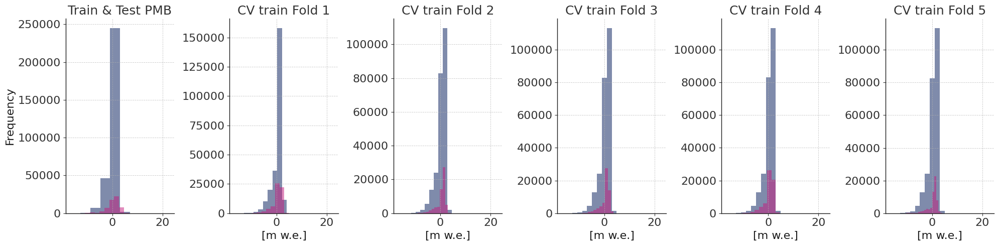

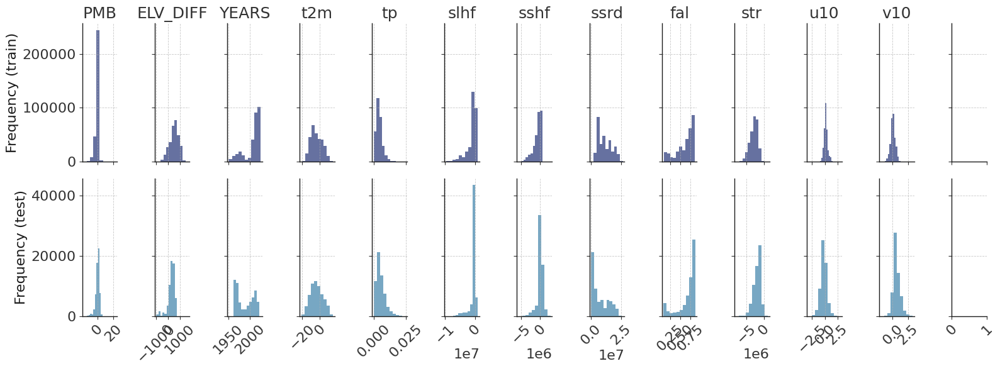

In [30]:
splits, test_set, train_set = get_CV_splits(dataloader_gl,
                                            test_split_on='GLACIER',
                                            test_splits=test_glaciers,
                                            random_state=cfg.seed)

print('Test glaciers: ({}) {}'.format(len(test_set['splits_vals']),
                                      test_set['splits_vals']))
test_perc = (len(test_set['df_X']) / len(train_set['df_X'])) * 100
print('Percentage of test size: {:.2f}%'.format(test_perc))
print('Size of test set:', len(test_set['df_X']))
print('Train glaciers: ({}) {}'.format(len(train_set['splits_vals']),
                                       train_set['splits_vals']))
print('Size of train set:', len(train_set['df_X']))

visualiseSplits(test_set['y'], train_set['y'], splits)
visualiseInputs(train_set, test_set, vois_climate)

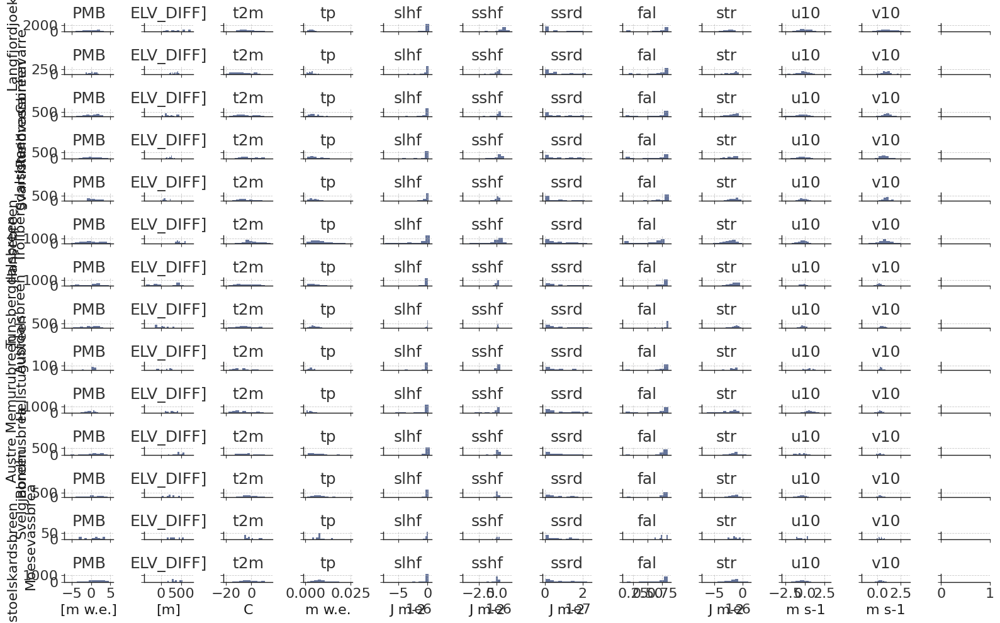

In [19]:
# This cells takes over 10 minuts to execute

# plot distributions of test glaciers:
f, ax = plt.subplots(len(test_glaciers),
                     len(vois_climate) + 3,
                     figsize=(16, 10),
                     sharey='row',
                     sharex='col')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl['POINT_BALANCE'].plot.hist(ax=ax[i, 0],
                                          color=color_dark_blue,
                                          alpha=0.6,
                                          density=False)
    ax[i, 0].set_title('PMB')
    ax[i, 0].set_ylabel(test_gl)
    ax[i, 0].set_xlabel('[m w.e.]')
    test_df_gl['ELEVATION_DIFFERENCE'].plot.hist(ax=ax[i, 1],
                                                 color=color_dark_blue,
                                                 alpha=0.6,
                                                 density=False)
    ax[i, 1].set_title('ELV_DIFF]')
    ax[i, 1].set_xlabel('[m]')

    for j, voi_clim in enumerate(vois_climate):
        ax[i, 2 + j].set_title(voi_clim)
        test_df_gl[voi_clim].plot.hist(ax=ax[i, 2 + j],
                                       color=color_dark_blue,
                                       alpha=0.6,
                                       density=False)
        ax[i, 2 + j].set_xlabel(vois_units[voi_clim])

plt.tight_layout()

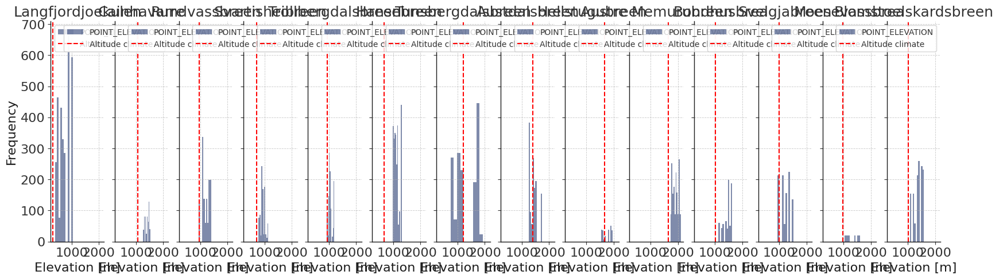

In [20]:
f, ax = plt.subplots(1,
                     len(test_glaciers),
                     figsize=(20, 5),
                     sharey='row',
                     sharex='row')

for i, test_gl in enumerate(test_glaciers):
    test_df_gl = test_set['df_X'][test_set['df_X'].GLACIER == test_gl]
    test_df_gl.POINT_ELEVATION.plot.hist(color=color_dark_blue,
                                         alpha=0.5,
                                         density=False,
                                         ax=ax[i])
    # add vertical line for altitude climate
    alt_climate = test_df_gl.ALTITUDE_CLIMATE.mean()
    ax[i].axvline(x=alt_climate,
                  color='red',
                  linestyle='--',
                  label='Altitude climate')
    ax[i].set_xlabel('Elevation [m]')
    ax[i].legend()
    ax[i].set_title(test_gl)
plt.tight_layout()

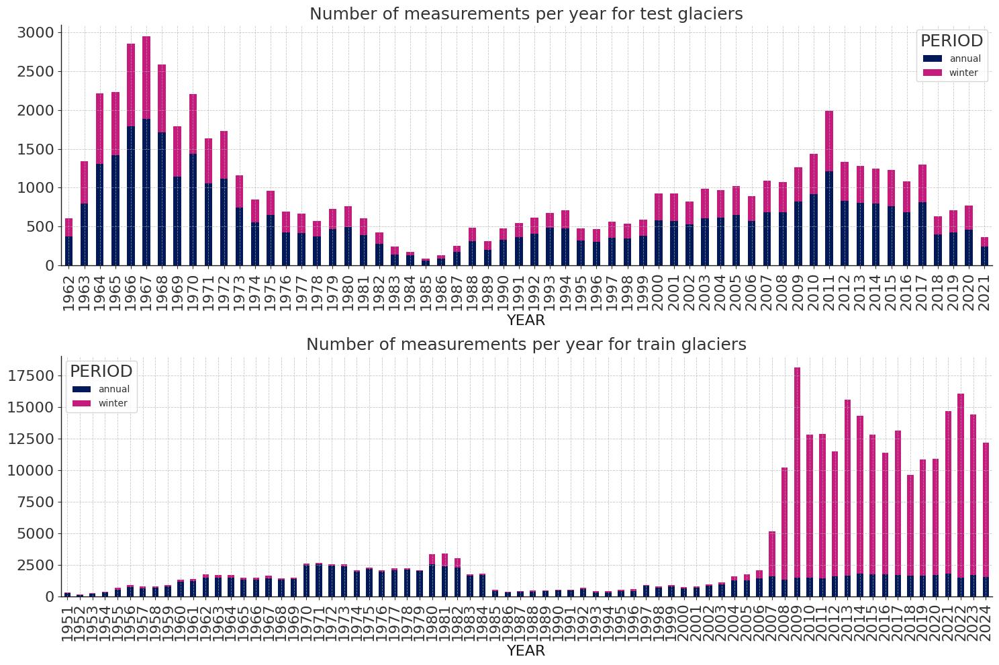

In [31]:
# Number of measurements per year:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))
data_test.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[0])
ax[0].set_title('Number of measurements per year for test glaciers')

# Number of measurements per year:
data_train.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar', stacked=True, color=[color_dark_blue, color_pink], ax=ax[1])
ax[1].set_title('Number of measurements per year for train glaciers')
plt.tight_layout()

#### XGBoost

In [32]:
# Grid search
# For each of the XGBoost parameter, define the grid range
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8],
    'n_estimators':
    [50, 100, 200, 300, 400, 500, 600,
     700],  # number of trees (too many = overfitting, too few = underfitting)
    'learning_rate': [0.01, 0.1, 0.15, 0.2, 0.25, 0.3]
}

param_init = {}
param_init['device'] = 'cuda:0'
param_init['tree_method'] = 'hist'
param_init["random_state"] = cfg.seed
param_init["n_jobs"] = cfg.numJobs

vois_climate = [
    't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
]

vois_topographical = [
    "aspect",
    "slope",
    "hugonnet_dhdt",
    "consensus_ice_thickness",
    #"millan_v",
]

#### Grid Search

In [33]:
%%time
# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

RUN = False
if RUN:
    # Create a CustomXGBoostRegressor instance
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg, **param_init)
    custom_xgboost.randomsearch(
        parameters=param_grid,
        n_iter=45,
        splits=splits,
        features=df_X_train_subset,
        targets=train_set['y'],
    )

    # save best model
    custom_xgboost.save_model(f'CH_train_NOR_test.pkl')
else:
    # read model
    custom_xgboost = mbm.models.CustomXGBoostRegressor(cfg)
    custom_xgboost.load_model(
        f'CH_train_NOR_test.pkl')  # model with SGI aspect&slope

# Get best parameters and estimator
best_params = custom_xgboost.param_search.best_params_
best_estimator = custom_xgboost.param_search.best_estimator_
print("Best parameters:\n", best_params)
print("Best score:\n", custom_xgboost.param_search.best_score_)

# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

# Make predictions on test
features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)

# Calculate scores
score = best_estimator_cpu.score(test_set['df_X'][all_columns],
                                 test_set['y'])  # negative
print('Overall score:', np.abs(score))

Shape of training dataset: (301118, 25)
Shape of testing dataset: (60265, 25)
Running with features: ['ELEVATION_DIFFERENCE', 't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10', 'aspect', 'slope', 'hugonnet_dhdt', 'consensus_ice_thickness']
Best parameters:
 {'n_estimators': 500, 'max_depth': 8, 'learning_rate': 0.01}
Best score:
 -0.2039305227297354
Shape of the test: (60265, 14)
Overall score: 2.9116013133486205
CPU times: user 4.97 s, sys: 111 ms, total: 5.08 s
Wall time: 646 ms


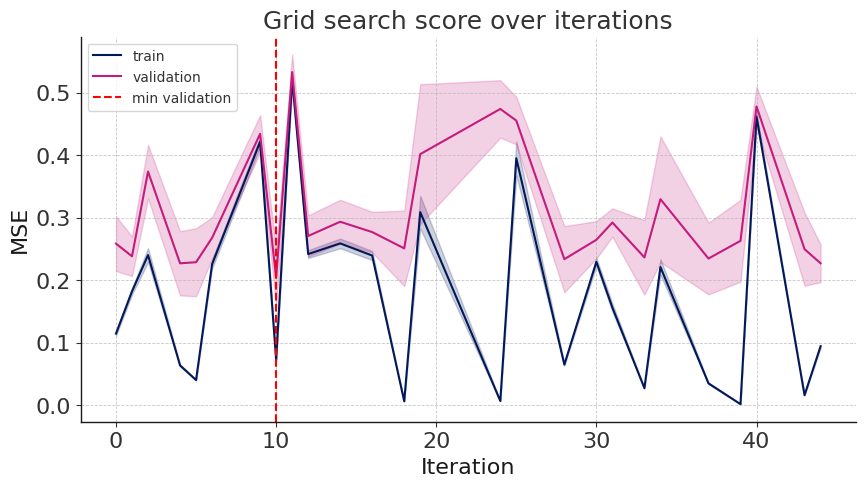

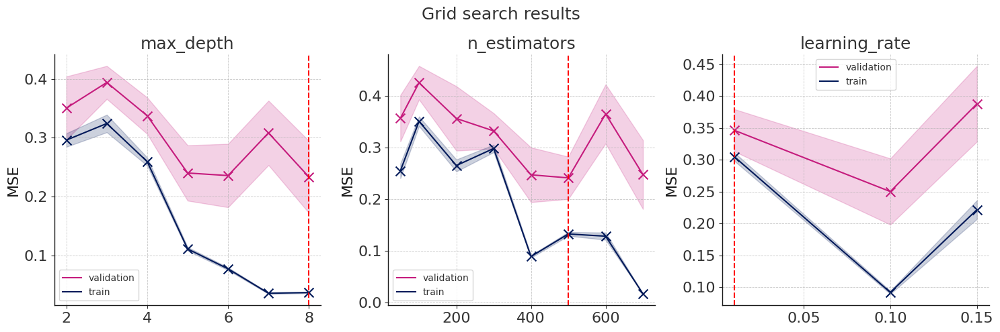

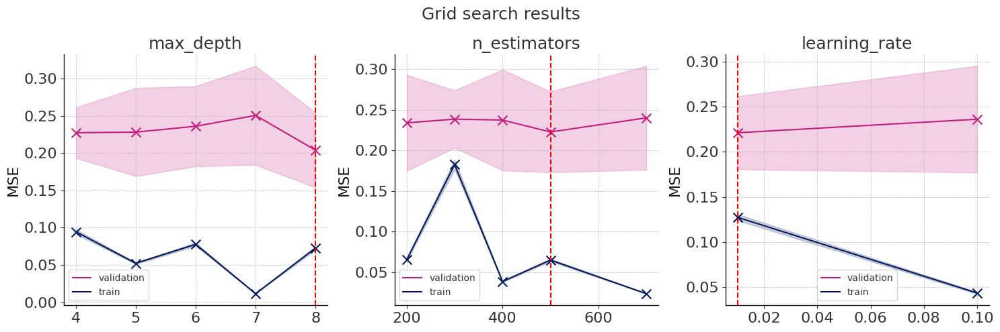

In [34]:
plotGridSearchScore(cv_results_=custom_xgboost.param_search.cv_results_,
                    lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss)
plotGridSearchParams(custom_xgboost.param_search.cv_results_,
                     param_grid,
                     lossType=cfg.loss,
                     N=10)

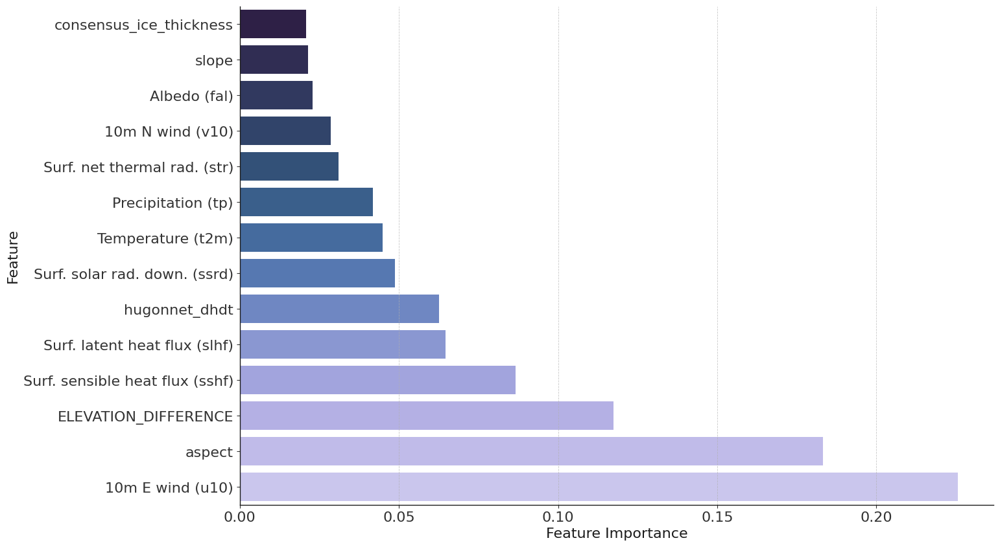

In [35]:
FIPlot(best_estimator, feature_columns, vois_climate)

Shape of the test: (60265, 14)
{'Langfjordjoekulen': '#a6cee3', 'Blaaisen': '#1f78b4', 'Storsteinsfjellbreen': '#b2df8a', 'Cainhavarre': '#33a02c', 'Rundvassbreen': '#fb9a99', 'Storglombreen N': '#e31a1c', 'Engabreen': '#fdbf6f', 'Svartisheibreen': '#ff7f00', 'Hoegtuvbreen': '#cab2d6', 'Trollbergdalsbreen': '#6a3d9a', 'Aalfotbreen': '#ffff99', 'Hansebreen': '#b15928', 'Vetlefjordbreen': '#8dd3c7', 'Nigardsbreen': '#ffffb3', 'Tunsbergdalsbreen': '#bebada', 'Vesledalsbreen': '#fb8072', 'Austdalsbreen': '#80b1d3', 'Harbardsbreen': '#fdb462', 'Juvfonne': '#b3de69', 'Graasubreen': '#fccde5', 'Hellstugubreen': '#d9d9d9', 'Austre Memurubreen': '#bc80bd', 'Vestre Memurubreen': '#ccebc5', 'Rembesdalskaaka': '#ffed6f', 'Blabreen': '#66c2a5', 'Graafjellsbrea': '#fc8d62', 'Breidablikkbrea': '#8da0cb', 'Ruklebreen': '#e78ac3', 'Bondhusbrea': '#a6d854', 'Svelgjabreen': '#ffd92f', 'Moesevassbrea': '#e5c494', 'Blomstoelskardsbreen': '#b3b3b3'}


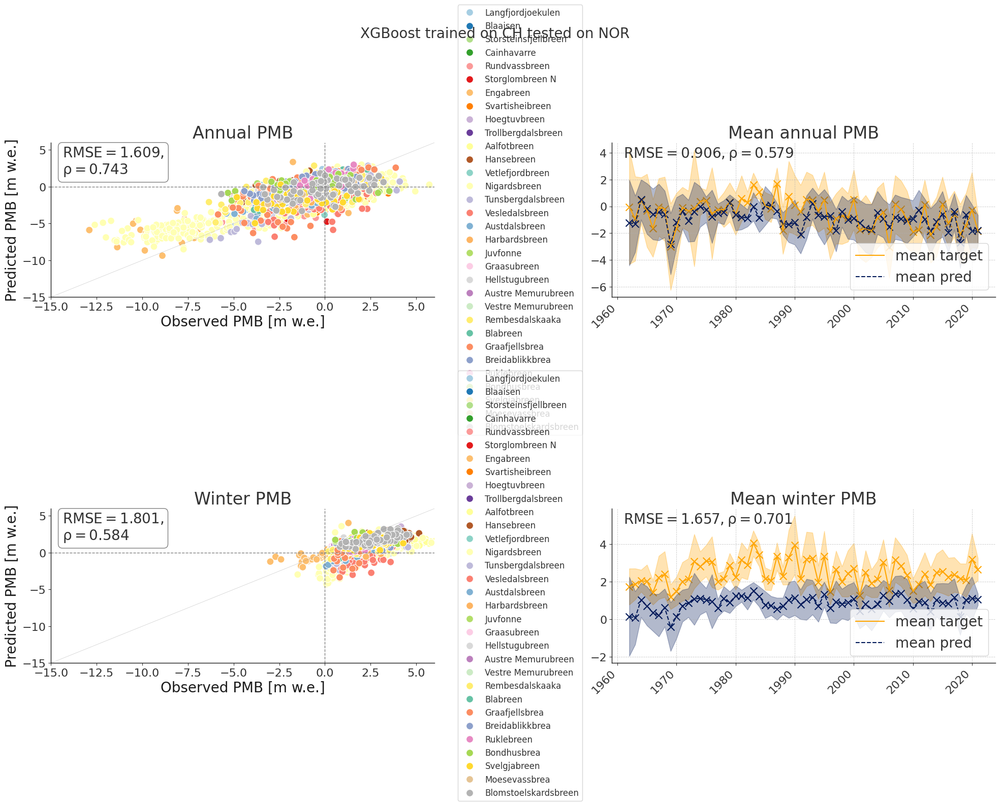

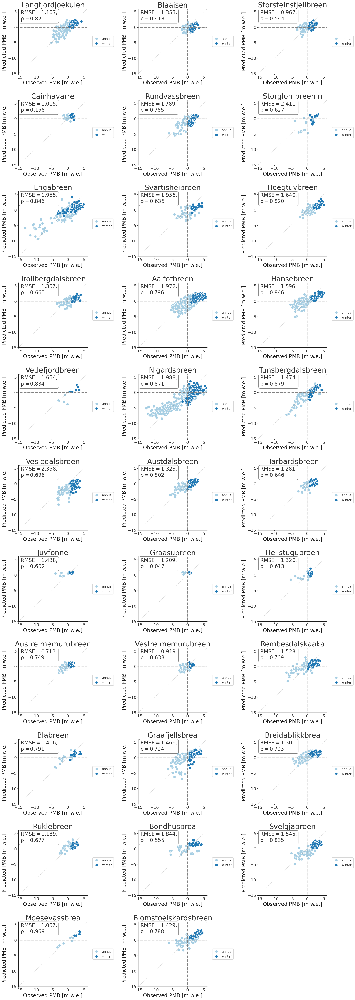

In [36]:
# Make predictions on test:
# Set to CPU for predictions:
best_estimator_cpu = best_estimator.set_params(device='cpu')

features_test, metadata_test = best_estimator_cpu._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = best_estimator_cpu.predict(features_test)
print('Shape of the test:', features_test.shape)

y_pred_agg = best_estimator_cpu.aggrPredict(metadata_test, features_test)
grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu)
plt.suptitle(f'XGBoost trained on CH tested on NOR', fontsize=20)
plt.tight_layout()

PlotIndividualGlacierPredVsTruth(grouped_ids, base_figsize=(20, 15))

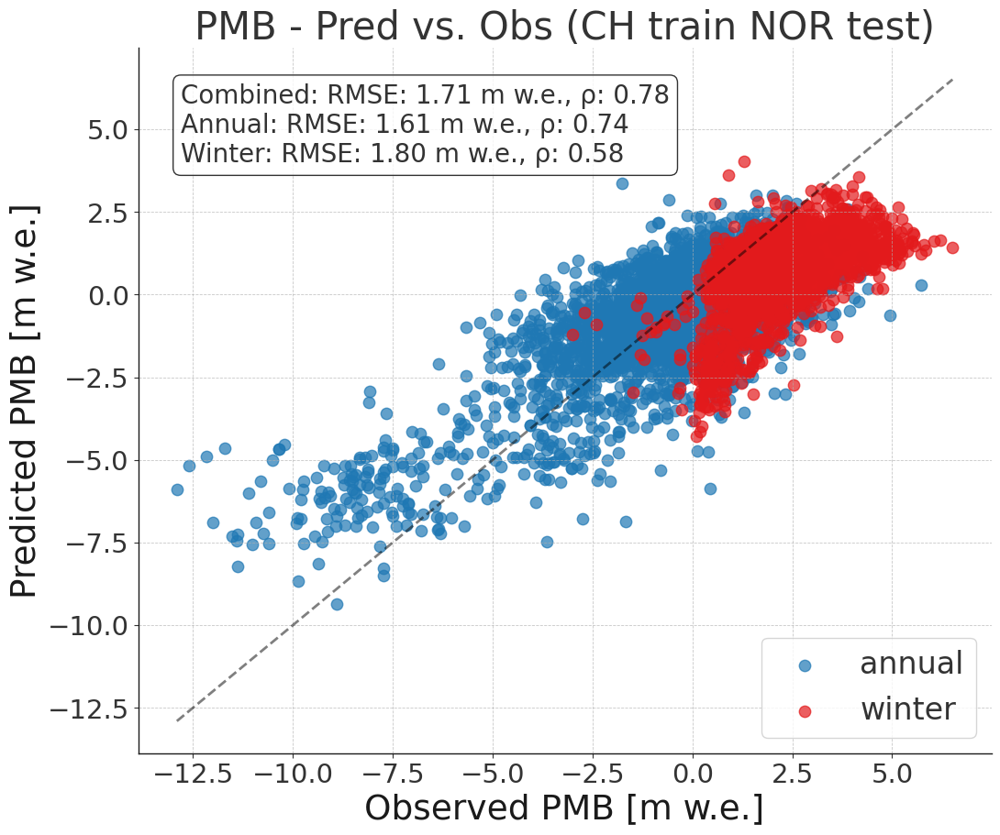

In [38]:
PlotPredictionsCombined(grouped_ids, y_pred, metadata_test, test_set,
                best_estimator_cpu, region_name='CH train NOR test')

In [27]:
display(grouped_ids)
display(y_pred)
display(metadata_test)
display(test_set)
display(best_estimator_cpu)

,target,YEAR,POINT_ID,pred,PERIOD,GLACIER
ID,,,,,,
0,-4.92,2013,Langfjordjoekulen_2013_annual_0,-4.996495,annual,Langfjordjoekulen
1,-2.67,2014,Langfjordjoekulen_2014_annual_1,-0.574431,annual,Langfjordjoekulen
2,-3.41,2015,Langfjordjoekulen_2015_annual_2,-3.254854,annual,Langfjordjoekulen
3,-3.59,2016,Langfjordjoekulen_2016_annual_3,-4.531826,annual,Langfjordjoekulen
4,-2.46,2017,Langfjordjoekulen_2017_annual_4,-1.264071,annual,Langfjordjoekulen
...,...,...,...,...,...,...
6292,1.50,2012,Blomstoelskardsbreen_2012_winter_7656,1.388864,winter,Blomstoelskardsbreen
6293,1.14,2013,Blomstoelskardsbreen_2013_winter_7657,0.804129,winter,Blomstoelskardsbreen
6294,1.19,2015,Blomstoelskardsbreen_2015_winter_7658,1.412407,winter,Blomstoelskardsbreen


array([-0.04461712,  0.0199759 , -0.19658348, ...,  0.23462115,
        0.17484814,  0.19809352], dtype=float32)

array([['RGI60-08.01258', 'Langfjordjoekulen_2013_annual_0', 0, ...,
        'oct', 'annual', 'Langfjordjoekulen'],
       ['RGI60-08.01258', 'Langfjordjoekulen_2013_annual_0', 0, ...,
        'nov', 'annual', 'Langfjordjoekulen'],
       ['RGI60-08.01258', 'Langfjordjoekulen_2013_annual_0', 0, ...,
        'dec', 'annual', 'Langfjordjoekulen'],
       ...,
       ['RGI60-08.02969', 'Blomstoelskardsbreen_2017_winter_7660', 6296,
        ..., 'feb', 'winter', 'Blomstoelskardsbreen'],
       ['RGI60-08.02969', 'Blomstoelskardsbreen_2017_winter_7660', 6296,
        ..., 'mar', 'winter', 'Blomstoelskardsbreen'],
       ['RGI60-08.02969', 'Blomstoelskardsbreen_2017_winter_7660', 6296,
        ..., 'apr', 'winter', 'Blomstoelskardsbreen']], dtype=object)

{'df_X':        YEAR  POINT_LON  POINT_LAT  POINT_BALANCE  ALTITUDE_CLIMATE  \
 0      2013   21.77702   70.12589          -4.92        341.344485   
 1      2013   21.77702   70.12589          -4.92        341.344485   
 2      2013   21.77702   70.12589          -4.92        341.344485   
 3      2013   21.77702   70.12589          -4.92        341.344485   
 4      2013   21.77702   70.12589          -4.92        341.344485   
 ...     ...        ...        ...            ...               ...   
 60260  2017    6.34738   59.93791           1.15        917.733158   
 60261  2017    6.34738   59.93791           1.15        917.733158   
 60262  2017    6.34738   59.93791           1.15        917.733158   
 60263  2017    6.34738   59.93791           1.15        917.733158   
 60264  2017    6.34738   59.93791           1.15        917.733158   
 
        ELEVATION_DIFFERENCE  POINT_ELEVATION           RGIId  \
 0                129.655515            471.0  RGI60-08.01258   
 1      

CustomXGBoostRegressor(base_score=None, booster=None, callbacks=None,
                       cfg=<massbalancemachine.config.NorwayConfig object at 0x7fc984e72ed0>,
                       colsample_bylevel=None, colsample_bynode=None,
                       colsample_bytree=None, device='cpu',
                       early_stopping_rounds=None, enable_categorical=False,
                       eval_metric=None, feature_types=None, gamma=None,
                       grow_policy=None, importance_type=None,
                       interaction_constraints=None, learning_rate=0.01,
                       max_bin=None, max_cat_threshold=None,
                       max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
                       max_leaves=None, min_child_weight=None, missing=nan,
                       monotone_constraints=None, multi_strategy=None,
                       n_estimators=500, n_jobs=-1, num_parallel_tree=None, ...)

### Predictions of custom parameters:

In [ ]:
custom_params = {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 800}

# Feature columns:
feature_columns = [
    'ELEVATION_DIFFERENCE'
] + list(vois_climate) + list(vois_topographical) + ['pcsr']
# feature_columns = ['ELEVATION_DIFFERENCE'
#                    ] + list(vois_climate) + list(vois_topographical)
all_columns = feature_columns + cfg.fieldsNotFeatures
df_X_train_subset = train_set['df_X'][all_columns]
print('Shape of training dataset:', df_X_train_subset.shape)
print('Shape of testing dataset:', test_set['df_X'][all_columns].shape)
print('Running with features:', feature_columns)

params = {**param_init, **custom_params}
print(params)
custom_model = mbm.models.CustomXGBoostRegressor(cfg, **params)

# Fit on train data:
custom_model.fit(train_set['df_X'][all_columns], train_set['y'])

# Make predictions on test
custom_model = custom_model.set_params(device='cpu')
features_test, metadata_test = custom_model._create_features_metadata(
    test_set['df_X'][all_columns])
y_pred = custom_model.predict(features_test)
print('Shape of the test:', features_test.shape)

# Make predictions aggr to meas ID:
y_pred_agg = custom_model.aggrPredict(metadata_test, features_test)

# Calculate scores
score = custom_model.score(test_set['df_X'][all_columns],
                           test_set['y'])  # negative
print('Overall score:', np.abs(score))

grouped_ids = getDfAggregatePred(test_set, y_pred_agg, all_columns)
PlotPredictions(grouped_ids, y_pred, metadata_test, test_set, custom_model)
plt.suptitle(f'MBM tested on {test_glaciers}', fontsize=20)
plt.tight_layout()

In [ ]:
# Aggregate predictions to annual or winter:
PlotIndividualGlacierPredVsTruth(grouped_ids, figsize=(20, 15))

In [ ]:
FIPlot(custom_model, feature_columns, vois_climate)

## Extrapolate in space


### Geodetic MB:

In [ ]:
geodetic_mb = get_geodetic_MB()

# filter to glaciers with potential clear sky radiation data
geodetic_mb = geodetic_mb[geodetic_mb.glacier_name.isin(glDirect)]

# get years per glacier
years_start_per_gl = geodetic_mb.groupby(
    'glacier_name')['Astart'].unique().apply(list).to_dict()
years_end_per_gl = geodetic_mb.groupby('glacier_name')['Aend'].unique().apply(
    list).to_dict()

periods_per_glacier = defaultdict(list)
geoMB_per_glacier = defaultdict(list)

# Iterate through the DataFrame rows
for _, row in geodetic_mb.iterrows():
    glacier_name = row['glacier_name']
    start_year = row['Astart']
    end_year = row['Aend']
    geoMB = row['Bgeod']

    # Append the (start, end) tuple to the glacier's list
    # Only if period is longer than 5 years
    if end_year - start_year >= 5:
        periods_per_glacier[glacier_name].append((start_year, end_year))
        geoMB_per_glacier[glacier_name].append(geoMB)

# sort by glacier_list
periods_per_glacier = dict(sorted(periods_per_glacier.items()))
geoMB_per_glacier = dict(sorted(geoMB_per_glacier.items()))

### Glacier wide MB: 
Compute 2D fields.

In [ ]:
glDirect = [
    re.search(r'xr_direct_(.*?).zarr', f).group(1)
    for f in os.listdir(path_pcsr + 'zarr/')
]
data_glamos = data_glamos[data_glamos.GLACIER.isin(glDirect)]
glacier_list = list(data_glamos.GLACIER.unique())
print('Number of glaciers with pcsr:', len(glacier_list))

# satellite_glaciers = [
#     'adler', 'aletsch', 'allalin', 'basodino', 'clariden', 'findelen', 'gries',
#     'hohlaub', 'limmern', 'oberaar', 'plattalva', 'rhone', 'sanktanna',
#     'schwarzbach', 'schwarzberg'
# ]

geodetic_glaciers = periods_per_glacier.keys()
print('Number of glaciers with geodetic MB:', len(geodetic_glaciers))

# Intersection of both
common_glaciers = list(set(geodetic_glaciers) & set(glacier_list))
print('Number of common glaciers:', len(common_glaciers))

# Sort glaciers by area
gl_area = get_gl_area()
gl_area['clariden'] = gl_area['claridenL']


# Sort the lists by area if available in gl_area
def sort_by_area(glacier_list, gl_area):
    return sorted(glacier_list, key=lambda g: gl_area.get(g, 0), reverse=False)


glacier_list = sort_by_area(common_glaciers, gl_area)
glacier_list

#### GLAMOS grids & Normal T & P:

In [ ]:
RUN = False
if RUN:
    # Define paths
    path_save_glw = '/home/mburlet/scratch/data/DATA_MB/DEV/GLAMOS/distributed_MB_grids/MBM/glamos_dems/'
    path_xr_grids = '/home/mburlet/scratch/data/DATA_MB/DEV/GLAMOS/topo/GLAMOS_DEM/xr_masked_grids/'  # GLAMOS DEMs

    emptyfolder(path_save_glw)

    # Feature columns
    vois_climate = [
        't2m', 'tp', 'slhf', 'sshf', 'ssrd', 'fal', 'str', 'u10', 'v10'
    ]
    # feature_columns = ['ELEVATION_DIFFERENCE'
    #                    ] + list(vois_climate) + list(vois_topographical)
    feature_columns = [
        'ELEVATION_DIFFERENCE'
    ] + list(vois_climate) + list(vois_topographical) + ['pcsr']
    all_columns = feature_columns + cfg.fieldsNotFeatures
    print('Running for feature columns:', all_columns)

    for glacier_name in glacier_list:
        glacier_path = os.path.join(path_glacier_grid_glamos, glacier_name)

        if not os.path.exists(glacier_path):
            print(f"Folder not found for {glacier_name}, skipping...")
            continue

        glacier_files = sorted(
            [f for f in os.listdir(glacier_path) if glacier_name in f])

        print(f"Processing {glacier_name} ({len(glacier_files)} files)")

        glacier_files = sort_by_area(glacier_files, gl_area)

        for file_name in tqdm(glacier_files,
                              desc=f"Processing {glacier_name}",
                              leave=False):
            year = int(file_name.split('_')[2].split('.')[0])

            # Load parquet input glacier grid file in monthly format (pre-processed)
            df_grid_monthly = pd.read_parquet(
                os.path.join(path_glacier_grid_glamos, glacier_name,
                             file_name))
            df_grid_monthly.drop_duplicates(inplace=True)

            # Keep only necessary columns, avoiding missing columns issues
            df_grid_monthly = df_grid_monthly[[
                col for col in all_columns if col in df_grid_monthly.columns
            ]]

            # Add GLWD_ID
            # df_grid_monthly['GLWD_ID'] = df_grid_monthly.apply(
            #     lambda x: get_hash(f"{x.GLACIER}_{x.YEAR}"), axis=1)
            # df_grid_monthly['GLWD_ID'] = df_grid_monthly['GLWD_ID'].astype(str)

            # Create geodata object
            geoData = mbm.GeoData(df_grid_monthly)

            # Computes and saves gridded MB for a year and glacier
            path_glacier_dem = os.path.join(path_xr_grids,
                                            f"{glacier_name}_{year}.zarr")
            geoData.gridded_MB_pred(custom_model,
                                    glacier_name,
                                    year,
                                    all_columns,
                                    path_glacier_dem,
                                    path_save_glw,
                                    cfg,
                                    save_monthly_pred=True)

In [ ]:
glacier_name = 'clariden'
year = 2010
# open xarray
xr.open_dataset(
    path_save_glw +
    f'{glacier_name}/{glacier_name}_{year}_annual.zarr').pred_masked.plot()